# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: pc74uwwj
Name: dark-water-613
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/pc74uwwj
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_085939-pc74uwwj/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-95523b9a-2688-5f02-b0c1-5937010d5d7a]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 222,375,447,183,381,299,545,139,475,366,430,379,245,295,45,211,438,288,278,524,241,259,148,53,329,150,120,290,104,93,178,200,50,334,236,172,265,146,97,186,391,463,320,959,144,396,178,200,289,325,217,149,367,269,265,385,312,646,288,291,222,571,241,147,257,341,278,727,351,362,262,372,384,366,136,228,219,156,61,127,197,493,301,280,343,218,150,241,388,167,149,101,264,396,160,163,431,74,161,296,180,376,108,239,189,223,332,137,149,291,272,109,99,353,340,359,263,43,49,216,223,262,81,207,310,237,173,244,285,214,973,263,195,522,298,154,513,350,491,455,206,453,469,276,362,253,351,245,283,306,273,242,260,391,380,252,244,196,152,614,250,257,136,157,177,158,524,248,367,213,275,421,614,408,308,258,234,230,169,178,213,183,200,255,604,349,333,366,388,7099,420,277,205,161,365,178,266,274,165,32

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 54,106,111,49,114,80,142,36,107,97,103,85,56,63,14,53,124,77,70,139,65,76,40,11,81,34,14,74,22,14,52,45,14,78,50,39,66,34,17,51,77,103,95,260,35,79,37,41,66,73,68,29,103,59,64,93,75,141,94,75,68,160,56,36,65,84,76,178,90,83,62,87,67,79,23,56,58,35,10,24,50,137,81,65,83,54,42,54,91,49,26,29,65,98,32,37,121,22,32,72,35,87,18,64,48,51,78,30,34,77,77,31,42,92,87,85,64,11,10,50,55,67,15,47,85,74,64,54,76,49,224,74,46,125,77,38,110,82,135,126,55,118,110,62,89,47,93,57,80,60,66,60,59,109,117,61,54,41,40,156,60,36,40,29,38,44,143,67,113,56,70,91,136,105,64,64,50,61,49,44,51,53,55,50,159,85,79,80,75,1808,110,72,40,50,81,39,65,58,35,76,36,64,71,76,79,124,62,60,100,25,14,47,65,80,22,64,67,81,37,52,75,86,52,75,49,61,63,66,55,60,61,111,52,74,18,49,52,127,146,134,84,81,80,60,216,102,24,52,

Epoch 1/1000:   0%|          | 1/1000 [00:22<6:12:53, 22.40s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:22<6:12:53, 22.40s/it, v_num=wj_1, total_loss_train=1.46e+3, kl_local_train=126]

Epoch 2/1000:   0%|          | 1/1000 [00:22<6:12:53, 22.40s/it, v_num=wj_1, total_loss_train=1.46e+3, kl_local_train=126]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:47:11, 13.66s/it, v_num=wj_1, total_loss_train=1.46e+3, kl_local_train=126]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:47:11, 13.66s/it, v_num=wj_1, total_loss_train=1.31e+3, kl_local_train=51.9]

Epoch 3/1000:   0%|          | 2/1000 [00:29<3:47:11, 13.66s/it, v_num=wj_1, total_loss_train=1.31e+3, kl_local_train=51.9]

Epoch 3/1000:   0%|          | 3/1000 [00:39<3:13:19, 11.63s/it, v_num=wj_1, total_loss_train=1.31e+3, kl_local_train=51.9]

Epoch 3/1000:   0%|          | 3/1000 [00:39<3:13:19, 11.63s/it, v_num=wj_1, total_loss_train=1.3e+3, kl_local_train=3.88] 

Epoch 4/1000:   0%|          | 3/1000 [00:39<3:13:19, 11.63s/it, v_num=wj_1, total_loss_train=1.3e+3, kl_local_train=3.88]

Epoch 4/1000:   0%|          | 4/1000 [00:47<2:51:32, 10.33s/it, v_num=wj_1, total_loss_train=1.3e+3, kl_local_train=3.88]

Epoch 4/1000:   0%|          | 4/1000 [00:47<2:51:32, 10.33s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=1.41]

Epoch 5/1000:   0%|          | 4/1000 [00:47<2:51:32, 10.33s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=1.41]

Epoch 5/1000:   0%|          | 5/1000 [00:54<2:34:14,  9.30s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=1.41]

Epoch 5/1000:   0%|          | 5/1000 [00:54<2:34:14,  9.30s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=8.22]

Epoch 6/1000:   0%|          | 5/1000 [00:54<2:34:14,  9.30s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=8.22]

Epoch 6/1000:   1%|          | 6/1000 [01:03<2:27:35,  8.91s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=8.22]

Epoch 6/1000:   1%|          | 6/1000 [01:03<2:27:35,  8.91s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=28]  

Epoch 7/1000:   1%|          | 6/1000 [01:03<2:27:35,  8.91s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=28]

Epoch 7/1000:   1%|          | 7/1000 [01:11<2:22:55,  8.64s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=28]

Epoch 7/1000:   1%|          | 7/1000 [01:11<2:22:55,  8.64s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=32.9]

Epoch 8/1000:   1%|          | 7/1000 [01:11<2:22:55,  8.64s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=32.9]

Epoch 8/1000:   1%|          | 8/1000 [01:18<2:16:53,  8.28s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=32.9]

Epoch 8/1000:   1%|          | 8/1000 [01:18<2:16:53,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 9/1000:   1%|          | 8/1000 [01:18<2:16:53,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 9/1000:   1%|          | 9/1000 [01:27<2:20:47,  8.52s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=32.2]

Epoch 9/1000:   1%|          | 9/1000 [01:27<2:20:47,  8.52s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 10/1000:   1%|          | 9/1000 [01:27<2:20:47,  8.52s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 10/1000:   1%|          | 10/1000 [01:35<2:15:18,  8.20s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=36.4]

Epoch 10/1000:   1%|          | 10/1000 [01:35<2:15:18,  8.20s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=37.3]

Epoch 11/1000:   1%|          | 10/1000 [01:35<2:15:18,  8.20s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=37.3]

Epoch 11/1000:   1%|          | 11/1000 [01:44<2:20:54,  8.55s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=37.3]

Epoch 11/1000:   1%|          | 11/1000 [01:44<2:20:54,  8.55s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]   

Epoch 12/1000:   1%|          | 11/1000 [01:44<2:20:54,  8.55s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]

Epoch 12/1000:   1%|          | 12/1000 [01:52<2:18:11,  8.39s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]

Epoch 12/1000:   1%|          | 12/1000 [01:52<2:18:11,  8.39s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]

Epoch 13/1000:   1%|          | 12/1000 [01:52<2:18:11,  8.39s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]

Epoch 13/1000:   1%|▏         | 13/1000 [02:00<2:16:59,  8.33s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=37]

Epoch 13/1000:   1%|▏         | 13/1000 [02:00<2:16:59,  8.33s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=37.7]

Epoch 14/1000:   1%|▏         | 13/1000 [02:00<2:16:59,  8.33s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=37.7]

Epoch 14/1000:   1%|▏         | 14/1000 [02:08<2:13:04,  8.10s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=37.7]

Epoch 14/1000:   1%|▏         | 14/1000 [02:08<2:13:04,  8.10s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=41.8]

Epoch 15/1000:   1%|▏         | 14/1000 [02:08<2:13:04,  8.10s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=41.8]

Epoch 15/1000:   2%|▏         | 15/1000 [02:15<2:10:03,  7.92s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=41.8]

Epoch 15/1000:   2%|▏         | 15/1000 [02:15<2:10:03,  7.92s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 16/1000:   2%|▏         | 15/1000 [02:15<2:10:03,  7.92s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 16/1000:   2%|▏         | 16/1000 [02:24<2:11:04,  7.99s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=50.5]

Epoch 16/1000:   2%|▏         | 16/1000 [02:24<2:11:04,  7.99s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=54]  

Epoch 17/1000:   2%|▏         | 16/1000 [02:24<2:11:04,  7.99s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=54]

Epoch 17/1000:   2%|▏         | 17/1000 [02:32<2:12:10,  8.07s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=54]

Epoch 17/1000:   2%|▏         | 17/1000 [02:32<2:12:10,  8.07s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=57.6]

Epoch 18/1000:   2%|▏         | 17/1000 [02:32<2:12:10,  8.07s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=57.6]

Epoch 18/1000:   2%|▏         | 18/1000 [02:39<2:08:46,  7.87s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=57.6]

Epoch 18/1000:   2%|▏         | 18/1000 [02:39<2:08:46,  7.87s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=61.4]

Epoch 19/1000:   2%|▏         | 18/1000 [02:39<2:08:46,  7.87s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=61.4]

Epoch 19/1000:   2%|▏         | 19/1000 [02:48<2:11:21,  8.03s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=61.4]

Epoch 19/1000:   2%|▏         | 19/1000 [02:48<2:11:21,  8.03s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=64.8]

Epoch 20/1000:   2%|▏         | 19/1000 [02:48<2:11:21,  8.03s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=64.8]

Epoch 20/1000:   2%|▏         | 20/1000 [02:57<2:15:56,  8.32s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=64.8]

Epoch 20/1000:   2%|▏         | 20/1000 [02:57<2:15:56,  8.32s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=69.1]

Epoch 21/1000:   2%|▏         | 20/1000 [02:57<2:15:56,  8.32s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=69.1]

Epoch 21/1000:   2%|▏         | 21/1000 [03:05<2:15:16,  8.29s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=69.1]

Epoch 21/1000:   2%|▏         | 21/1000 [03:05<2:15:16,  8.29s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=68.2]

Epoch 22/1000:   2%|▏         | 21/1000 [03:05<2:15:16,  8.29s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=68.2]

Epoch 22/1000:   2%|▏         | 22/1000 [03:13<2:16:08,  8.35s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=68.2]

Epoch 22/1000:   2%|▏         | 22/1000 [03:13<2:16:08,  8.35s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=75.2]

Epoch 23/1000:   2%|▏         | 22/1000 [03:13<2:16:08,  8.35s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=75.2]

Epoch 23/1000:   2%|▏         | 23/1000 [03:21<2:11:30,  8.08s/it, v_num=wj_1, total_loss_train=1.19e+3, kl_local_train=75.2]

Epoch 23/1000:   2%|▏         | 23/1000 [03:21<2:11:30,  8.08s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=74]   

Epoch 24/1000:   2%|▏         | 23/1000 [03:21<2:11:30,  8.08s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=74]

Epoch 24/1000:   2%|▏         | 24/1000 [03:28<2:08:30,  7.90s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=74]

Epoch 24/1000:   2%|▏         | 24/1000 [03:28<2:08:30,  7.90s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 25/1000:   2%|▏         | 24/1000 [03:28<2:08:30,  7.90s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:36<2:09:33,  7.97s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=76.4]

Epoch 25/1000:   2%|▎         | 25/1000 [03:36<2:09:33,  7.97s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=73.6]

Epoch 26/1000:   2%|▎         | 25/1000 [03:36<2:09:33,  7.97s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=73.6]

Epoch 26/1000:   3%|▎         | 26/1000 [03:44<2:10:00,  8.01s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=73.6]

Epoch 26/1000:   3%|▎         | 26/1000 [03:44<2:10:00,  8.01s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=80.5]

Epoch 27/1000:   3%|▎         | 26/1000 [03:44<2:10:00,  8.01s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=80.5]

Epoch 27/1000:   3%|▎         | 27/1000 [03:53<2:11:28,  8.11s/it, v_num=wj_1, total_loss_train=1.2e+3, kl_local_train=80.5]

Epoch 27/1000:   3%|▎         | 27/1000 [03:53<2:11:28,  8.11s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 28/1000:   3%|▎         | 27/1000 [03:53<2:11:28,  8.11s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 28/1000:   3%|▎         | 28/1000 [04:02<2:15:24,  8.36s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=79.9]

Epoch 28/1000:   3%|▎         | 28/1000 [04:02<2:15:24,  8.36s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=82.3]

Epoch 29/1000:   3%|▎         | 28/1000 [04:02<2:15:24,  8.36s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=82.3]

Epoch 29/1000:   3%|▎         | 29/1000 [04:10<2:14:52,  8.33s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=82.3]

Epoch 29/1000:   3%|▎         | 29/1000 [04:10<2:14:52,  8.33s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=81.5]

Epoch 30/1000:   3%|▎         | 29/1000 [04:10<2:14:52,  8.33s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=81.5]

Epoch 30/1000:   3%|▎         | 30/1000 [04:18<2:10:35,  8.08s/it, v_num=wj_1, total_loss_train=1.21e+3, kl_local_train=81.5]

Epoch 30/1000:   3%|▎         | 30/1000 [04:18<2:10:35,  8.08s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=82.4]

Epoch 31/1000:   3%|▎         | 30/1000 [04:18<2:10:35,  8.08s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=82.4]

Epoch 31/1000:   3%|▎         | 31/1000 [04:25<2:07:46,  7.91s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=82.4]

Epoch 31/1000:   3%|▎         | 31/1000 [04:25<2:07:46,  7.91s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=86.2]

Epoch 32/1000:   3%|▎         | 31/1000 [04:25<2:07:46,  7.91s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=86.2]

Epoch 32/1000:   3%|▎         | 32/1000 [04:33<2:05:50,  7.80s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=86.2]

Epoch 32/1000:   3%|▎         | 32/1000 [04:33<2:05:50,  7.80s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=87.8]

Epoch 33/1000:   3%|▎         | 32/1000 [04:33<2:05:50,  7.80s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=87.8]

Epoch 33/1000:   3%|▎         | 33/1000 [04:41<2:10:16,  8.08s/it, v_num=wj_1, total_loss_train=1.22e+3, kl_local_train=87.8]

Epoch 33/1000:   3%|▎         | 33/1000 [04:41<2:10:16,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=93.5]

Epoch 34/1000:   3%|▎         | 33/1000 [04:41<2:10:16,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=93.5]

Epoch 34/1000:   3%|▎         | 34/1000 [04:50<2:10:58,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=93.5]

Epoch 34/1000:   3%|▎         | 34/1000 [04:50<2:10:58,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=91.2]

Epoch 35/1000:   3%|▎         | 34/1000 [04:50<2:10:58,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=91.2]

Epoch 35/1000:   4%|▎         | 35/1000 [04:59<2:15:19,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=91.2]

Epoch 35/1000:   4%|▎         | 35/1000 [04:59<2:15:19,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=88]  

Epoch 36/1000:   4%|▎         | 35/1000 [04:59<2:15:19,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=88]

Epoch 36/1000:   4%|▎         | 36/1000 [05:07<2:14:24,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=88]

Epoch 36/1000:   4%|▎         | 36/1000 [05:07<2:14:24,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=87.7]

Epoch 37/1000:   4%|▎         | 36/1000 [05:07<2:14:24,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=87.7]

Epoch 37/1000:   4%|▎         | 37/1000 [05:16<2:16:37,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=87.7]

Epoch 37/1000:   4%|▎         | 37/1000 [05:16<2:16:37,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 38/1000:   4%|▎         | 37/1000 [05:16<2:16:37,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 38/1000:   4%|▍         | 38/1000 [05:23<2:11:49,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=99.9]

Epoch 38/1000:   4%|▍         | 38/1000 [05:23<2:11:49,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=97.5]

Epoch 39/1000:   4%|▍         | 38/1000 [05:23<2:11:49,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=97.5]

Epoch 39/1000:   4%|▍         | 39/1000 [05:31<2:08:23,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=97.5]

Epoch 39/1000:   4%|▍         | 39/1000 [05:31<2:08:23,  8.02s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 40/1000:   4%|▍         | 39/1000 [05:31<2:08:23,  8.02s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 40/1000:   4%|▍         | 40/1000 [05:38<2:05:55,  7.87s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=97.3]

Epoch 40/1000:   4%|▍         | 40/1000 [05:38<2:05:55,  7.87s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=98.7]

Epoch 41/1000:   4%|▍         | 40/1000 [05:38<2:05:55,  7.87s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=98.7]

Epoch 41/1000:   4%|▍         | 41/1000 [05:46<2:06:59,  7.94s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=98.7]

Epoch 41/1000:   4%|▍         | 41/1000 [05:46<2:06:59,  7.94s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=95]  

Epoch 42/1000:   4%|▍         | 41/1000 [05:46<2:06:59,  7.94s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=95]

Epoch 42/1000:   4%|▍         | 42/1000 [05:55<2:08:08,  8.03s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=95]

Epoch 42/1000:   4%|▍         | 42/1000 [05:55<2:08:08,  8.03s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=101]

Epoch 43/1000:   4%|▍         | 42/1000 [05:55<2:08:08,  8.03s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=101]

Epoch 43/1000:   4%|▍         | 43/1000 [06:03<2:08:45,  8.07s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=101]

Epoch 43/1000:   4%|▍         | 43/1000 [06:03<2:08:45,  8.07s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=98.2]

Epoch 44/1000:   4%|▍         | 43/1000 [06:03<2:08:45,  8.07s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=98.2]

Epoch 44/1000:   4%|▍         | 44/1000 [06:11<2:10:06,  8.17s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=98.2]

Epoch 44/1000:   4%|▍         | 44/1000 [06:11<2:10:06,  8.17s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=92.6]

Epoch 45/1000:   4%|▍         | 44/1000 [06:11<2:10:06,  8.17s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=92.6]

Epoch 45/1000:   4%|▍         | 45/1000 [06:19<2:07:18,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=92.6]

Epoch 45/1000:   4%|▍         | 45/1000 [06:19<2:07:18,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=95]  

Epoch 46/1000:   4%|▍         | 45/1000 [06:19<2:07:18,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=95]

Epoch 46/1000:   5%|▍         | 46/1000 [06:27<2:08:41,  8.09s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=95]

Epoch 46/1000:   5%|▍         | 46/1000 [06:27<2:08:41,  8.09s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=97.6]

Epoch 47/1000:   5%|▍         | 46/1000 [06:27<2:08:41,  8.09s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=97.6]

Epoch 47/1000:   5%|▍         | 47/1000 [06:35<2:05:31,  7.90s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=97.6]

Epoch 47/1000:   5%|▍         | 47/1000 [06:35<2:05:31,  7.90s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=100] 

Epoch 48/1000:   5%|▍         | 47/1000 [06:35<2:05:31,  7.90s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=100]

Epoch 48/1000:   5%|▍         | 48/1000 [06:42<2:03:20,  7.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=100]

Epoch 48/1000:   5%|▍         | 48/1000 [06:42<2:03:20,  7.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=99.2]

Epoch 49/1000:   5%|▍         | 48/1000 [06:42<2:03:20,  7.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=99.2]

Epoch 49/1000:   5%|▍         | 49/1000 [06:50<2:05:12,  7.90s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=99.2]

Epoch 49/1000:   5%|▍         | 49/1000 [06:50<2:05:12,  7.90s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.9]

Epoch 50/1000:   5%|▍         | 49/1000 [06:50<2:05:12,  7.90s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.9]

Epoch 50/1000:   5%|▌         | 50/1000 [06:59<2:09:23,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.9]

Epoch 50/1000:   5%|▌         | 50/1000 [06:59<2:09:23,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 51/1000:   5%|▌         | 50/1000 [06:59<2:09:23,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 51/1000:   5%|▌         | 51/1000 [07:07<2:09:15,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 51/1000:   5%|▌         | 51/1000 [07:07<2:09:15,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.7]

Epoch 52/1000:   5%|▌         | 51/1000 [07:07<2:09:15,  8.17s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.7]

Epoch 52/1000:   5%|▌         | 52/1000 [07:15<2:06:22,  8.00s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.7]

Epoch 52/1000:   5%|▌         | 52/1000 [07:15<2:06:22,  8.00s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.9]

Epoch 53/1000:   5%|▌         | 52/1000 [07:15<2:06:22,  8.00s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.9]

Epoch 53/1000:   5%|▌         | 53/1000 [07:22<2:03:52,  7.85s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=91.9]

Epoch 53/1000:   5%|▌         | 53/1000 [07:22<2:03:52,  7.85s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 54/1000:   5%|▌         | 53/1000 [07:22<2:03:52,  7.85s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 54/1000:   5%|▌         | 54/1000 [07:31<2:07:14,  8.07s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=95.7]

Epoch 54/1000:   5%|▌         | 54/1000 [07:31<2:07:14,  8.07s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=92.7]

Epoch 55/1000:   5%|▌         | 54/1000 [07:31<2:07:14,  8.07s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=92.7]

Epoch 55/1000:   6%|▌         | 55/1000 [07:39<2:08:33,  8.16s/it, v_num=wj_1, total_loss_train=1.29e+3, kl_local_train=92.7]

Epoch 55/1000:   6%|▌         | 55/1000 [07:39<2:08:33,  8.16s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 55/1000 [07:39<2:08:33,  8.16s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 56/1000 [07:47<2:05:51,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.8]

Epoch 56/1000:   6%|▌         | 56/1000 [07:47<2:05:51,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.1]

Epoch 57/1000:   6%|▌         | 56/1000 [07:47<2:05:51,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.1]

Epoch 57/1000:   6%|▌         | 57/1000 [07:55<2:06:26,  8.04s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=90.1]

Epoch 57/1000:   6%|▌         | 57/1000 [07:55<2:06:26,  8.04s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=87.9]

Epoch 58/1000:   6%|▌         | 57/1000 [07:55<2:06:26,  8.04s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=87.9]

Epoch 58/1000:   6%|▌         | 58/1000 [08:03<2:03:46,  7.88s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=87.9]

Epoch 58/1000:   6%|▌         | 58/1000 [08:03<2:03:46,  7.88s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=84.1]

Epoch 59/1000:   6%|▌         | 58/1000 [08:03<2:03:46,  7.88s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=84.1]

Epoch 59/1000:   6%|▌         | 59/1000 [08:10<2:02:25,  7.81s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=84.1]

Epoch 59/1000:   6%|▌         | 59/1000 [08:10<2:02:25,  7.81s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 59/1000 [08:10<2:02:25,  7.81s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 60/1000 [08:18<2:01:06,  7.73s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=83.7]

Epoch 60/1000:   6%|▌         | 60/1000 [08:18<2:01:06,  7.73s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=86.8]

Epoch 61/1000:   6%|▌         | 60/1000 [08:18<2:01:06,  7.73s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=86.8]

Epoch 61/1000:   6%|▌         | 61/1000 [08:26<2:03:29,  7.89s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=86.8]

Epoch 61/1000:   6%|▌         | 61/1000 [08:26<2:03:29,  7.89s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.1]

Epoch 62/1000:   6%|▌         | 61/1000 [08:26<2:03:29,  7.89s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.1]

Epoch 62/1000:   6%|▌         | 62/1000 [08:34<2:05:34,  8.03s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.1]

Epoch 62/1000:   6%|▌         | 62/1000 [08:34<2:05:34,  8.03s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=82.2]

Epoch 63/1000:   6%|▌         | 62/1000 [08:34<2:05:34,  8.03s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=82.2]

Epoch 63/1000:   6%|▋         | 63/1000 [08:43<2:09:46,  8.31s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=82.2]

Epoch 63/1000:   6%|▋         | 63/1000 [08:43<2:09:46,  8.31s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.2]

Epoch 64/1000:   6%|▋         | 63/1000 [08:43<2:09:46,  8.31s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.2]

Epoch 64/1000:   6%|▋         | 64/1000 [08:52<2:09:30,  8.30s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.2]

Epoch 64/1000:   6%|▋         | 64/1000 [08:52<2:09:30,  8.30s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 64/1000 [08:52<2:09:30,  8.30s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 65/1000 [09:02<2:16:42,  8.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 65/1000 [09:02<2:16:42,  8.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.9]

Epoch 66/1000:   6%|▋         | 65/1000 [09:02<2:16:42,  8.77s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.9]

Epoch 66/1000:   7%|▋         | 66/1000 [09:10<2:14:45,  8.66s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.9]

Epoch 66/1000:   7%|▋         | 66/1000 [09:10<2:14:45,  8.66s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=81.4]

Epoch 67/1000:   7%|▋         | 66/1000 [09:10<2:14:45,  8.66s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=81.4]

Epoch 67/1000:   7%|▋         | 67/1000 [09:18<2:09:57,  8.36s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=81.4]

Epoch 67/1000:   7%|▋         | 67/1000 [09:18<2:09:57,  8.36s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=76.7]

Epoch 68/1000:   7%|▋         | 67/1000 [09:18<2:09:57,  8.36s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=76.7]

Epoch 68/1000:   7%|▋         | 68/1000 [09:25<2:06:38,  8.15s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=76.7]

Epoch 68/1000:   7%|▋         | 68/1000 [09:25<2:06:38,  8.15s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.7]

Epoch 69/1000:   7%|▋         | 68/1000 [09:25<2:06:38,  8.15s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.7]

Epoch 69/1000:   7%|▋         | 69/1000 [09:33<2:04:12,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=75.7]

Epoch 69/1000:   7%|▋         | 69/1000 [09:33<2:04:12,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.7]

Epoch 70/1000:   7%|▋         | 69/1000 [09:33<2:04:12,  8.00s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.7]

Epoch 70/1000:   7%|▋         | 70/1000 [09:41<2:05:37,  8.11s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.7]

Epoch 70/1000:   7%|▋         | 70/1000 [09:41<2:05:37,  8.11s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 71/1000:   7%|▋         | 70/1000 [09:41<2:05:37,  8.11s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 71/1000:   7%|▋         | 71/1000 [09:50<2:10:46,  8.45s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=72.8]

Epoch 71/1000:   7%|▋         | 71/1000 [09:50<2:10:46,  8.45s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 72/1000:   7%|▋         | 71/1000 [09:51<2:10:46,  8.45s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 72/1000:   7%|▋         | 72/1000 [09:58<2:06:44,  8.19s/it, v_num=wj_1, total_loss_train=1.28e+3, kl_local_train=70.2]

Epoch 72/1000:   7%|▋         | 72/1000 [09:58<2:06:44,  8.19s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.4]

Epoch 73/1000:   7%|▋         | 72/1000 [09:58<2:06:44,  8.19s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.4]

Epoch 73/1000:   7%|▋         | 73/1000 [10:06<2:04:01,  8.03s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.4]

Epoch 73/1000:   7%|▋         | 73/1000 [10:06<2:04:01,  8.03s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 74/1000:   7%|▋         | 73/1000 [10:06<2:04:01,  8.03s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 74/1000:   7%|▋         | 74/1000 [10:14<2:04:38,  8.08s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.7]

Epoch 74/1000:   7%|▋         | 74/1000 [10:14<2:04:38,  8.08s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=73.3]

Epoch 75/1000:   7%|▋         | 74/1000 [10:14<2:04:38,  8.08s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=73.3]

Epoch 75/1000:   8%|▊         | 75/1000 [10:22<2:02:35,  7.95s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=73.3]

Epoch 75/1000:   8%|▊         | 75/1000 [10:22<2:02:35,  7.95s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.2]

Epoch 76/1000:   8%|▊         | 75/1000 [10:22<2:02:35,  7.95s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.2]

Epoch 76/1000:   8%|▊         | 76/1000 [10:30<2:04:01,  8.05s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=69.2]

Epoch 76/1000:   8%|▊         | 76/1000 [10:30<2:04:01,  8.05s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 77/1000:   8%|▊         | 76/1000 [10:30<2:04:01,  8.05s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 77/1000:   8%|▊         | 77/1000 [10:38<2:05:03,  8.13s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.5]

Epoch 77/1000:   8%|▊         | 77/1000 [10:38<2:05:03,  8.13s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 78/1000:   8%|▊         | 77/1000 [10:38<2:05:03,  8.13s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 78/1000:   8%|▊         | 78/1000 [10:46<2:03:00,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=68.9]

Epoch 78/1000:   8%|▊         | 78/1000 [10:46<2:03:00,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.1]

Epoch 79/1000:   8%|▊         | 78/1000 [10:46<2:03:00,  8.00s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.1]

Epoch 79/1000:   8%|▊         | 79/1000 [10:53<2:00:59,  7.88s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=70.1]

Epoch 79/1000:   8%|▊         | 79/1000 [10:53<2:00:59,  7.88s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=67.6]

Epoch 80/1000:   8%|▊         | 79/1000 [10:54<2:00:59,  7.88s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=67.6]

Epoch 80/1000:   8%|▊         | 80/1000 [11:02<2:02:47,  8.01s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=67.6]

Epoch 80/1000:   8%|▊         | 80/1000 [11:02<2:02:47,  8.01s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.3]

Epoch 81/1000:   8%|▊         | 80/1000 [11:02<2:02:47,  8.01s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.3]

Epoch 81/1000:   8%|▊         | 81/1000 [11:10<2:04:58,  8.16s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.3]

Epoch 81/1000:   8%|▊         | 81/1000 [11:10<2:04:58,  8.16s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.3]

Epoch 82/1000:   8%|▊         | 81/1000 [11:10<2:04:58,  8.16s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.3]

Epoch 82/1000:   8%|▊         | 82/1000 [11:18<2:04:06,  8.11s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.3]

Epoch 82/1000:   8%|▊         | 82/1000 [11:18<2:04:06,  8.11s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.5]

Epoch 83/1000:   8%|▊         | 82/1000 [11:18<2:04:06,  8.11s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.5]

Epoch 83/1000:   8%|▊         | 83/1000 [11:27<2:06:50,  8.30s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=66.5]

Epoch 83/1000:   8%|▊         | 83/1000 [11:27<2:06:50,  8.30s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.6]

Epoch 84/1000:   8%|▊         | 83/1000 [11:27<2:06:50,  8.30s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.6]

Epoch 84/1000:   8%|▊         | 84/1000 [11:35<2:05:56,  8.25s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.6]

Epoch 84/1000:   8%|▊         | 84/1000 [11:35<2:05:56,  8.25s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.4]

Epoch 85/1000:   8%|▊         | 84/1000 [11:35<2:05:56,  8.25s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.4]

Epoch 85/1000:   8%|▊         | 85/1000 [11:43<2:02:15,  8.02s/it, v_num=wj_1, total_loss_train=1.27e+3, kl_local_train=65.4]

Epoch 85/1000:   8%|▊         | 85/1000 [11:43<2:02:15,  8.02s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=65]  

Epoch 86/1000:   8%|▊         | 85/1000 [11:43<2:02:15,  8.02s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=65]

Epoch 86/1000:   9%|▊         | 86/1000 [11:51<2:03:13,  8.09s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=65]

Epoch 86/1000:   9%|▊         | 86/1000 [11:51<2:03:13,  8.09s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 87/1000:   9%|▊         | 86/1000 [11:51<2:03:13,  8.09s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 87/1000:   9%|▊         | 87/1000 [11:59<2:05:20,  8.24s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.2]

Epoch 87/1000:   9%|▊         | 87/1000 [12:00<2:05:20,  8.24s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 88/1000:   9%|▊         | 87/1000 [12:00<2:05:20,  8.24s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 88/1000:   9%|▉         | 88/1000 [12:08<2:05:43,  8.27s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63.5]

Epoch 88/1000:   9%|▉         | 88/1000 [12:08<2:05:43,  8.27s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63]  

Epoch 89/1000:   9%|▉         | 88/1000 [12:08<2:05:43,  8.27s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63]

Epoch 89/1000:   9%|▉         | 89/1000 [12:15<2:02:27,  8.06s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=63]

Epoch 89/1000:   9%|▉         | 89/1000 [12:15<2:02:27,  8.06s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62.4]

Epoch 90/1000:   9%|▉         | 89/1000 [12:15<2:02:27,  8.06s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62.4]

Epoch 90/1000:   9%|▉         | 90/1000 [12:23<1:59:52,  7.90s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62.4]

Epoch 90/1000:   9%|▉         | 90/1000 [12:23<1:59:52,  7.90s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=64.4]

Epoch 91/1000:   9%|▉         | 90/1000 [12:23<1:59:52,  7.90s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=64.4]

Epoch 91/1000:   9%|▉         | 91/1000 [12:31<2:00:53,  7.98s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=64.4]

Epoch 91/1000:   9%|▉         | 91/1000 [12:31<2:00:53,  7.98s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.9]

Epoch 92/1000:   9%|▉         | 91/1000 [12:31<2:00:53,  7.98s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.9]

Epoch 92/1000:   9%|▉         | 92/1000 [12:39<1:58:47,  7.85s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.9]

Epoch 92/1000:   9%|▉         | 92/1000 [12:39<1:58:47,  7.85s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]  

Epoch 93/1000:   9%|▉         | 92/1000 [12:39<1:58:47,  7.85s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]

Epoch 93/1000:   9%|▉         | 93/1000 [12:47<2:02:41,  8.12s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]

Epoch 93/1000:   9%|▉         | 93/1000 [12:47<2:02:41,  8.12s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.7]

Epoch 94/1000:   9%|▉         | 93/1000 [12:47<2:02:41,  8.12s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.7]

Epoch 94/1000:   9%|▉         | 94/1000 [12:55<2:00:09,  7.96s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.7]

Epoch 94/1000:   9%|▉         | 94/1000 [12:55<2:00:09,  7.96s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.6]

Epoch 95/1000:   9%|▉         | 94/1000 [12:55<2:00:09,  7.96s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.6]

Epoch 95/1000:  10%|▉         | 95/1000 [13:03<1:58:05,  7.83s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.6]

Epoch 95/1000:  10%|▉         | 95/1000 [13:03<1:58:05,  7.83s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.5]

Epoch 96/1000:  10%|▉         | 95/1000 [13:03<1:58:05,  7.83s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.5]

Epoch 96/1000:  10%|▉         | 96/1000 [13:11<1:59:35,  7.94s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.5]

Epoch 96/1000:  10%|▉         | 96/1000 [13:11<1:59:35,  7.94s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 97/1000:  10%|▉         | 96/1000 [13:11<1:59:35,  7.94s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 97/1000:  10%|▉         | 97/1000 [13:18<1:57:26,  7.80s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 97/1000:  10%|▉         | 97/1000 [13:18<1:57:26,  7.80s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 98/1000:  10%|▉         | 97/1000 [13:18<1:57:26,  7.80s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 98/1000:  10%|▉         | 98/1000 [13:26<1:55:20,  7.67s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.8]

Epoch 98/1000:  10%|▉         | 98/1000 [13:26<1:55:20,  7.67s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.4]

Epoch 99/1000:  10%|▉         | 98/1000 [13:26<1:55:20,  7.67s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.4]

Epoch 99/1000:  10%|▉         | 99/1000 [13:33<1:54:10,  7.60s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.4]

Epoch 99/1000:  10%|▉         | 99/1000 [13:33<1:54:10,  7.60s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.9]

Epoch 100/1000:  10%|▉         | 99/1000 [13:33<1:54:10,  7.60s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.9]

Epoch 100/1000:  10%|█         | 100/1000 [13:41<1:54:16,  7.62s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=60.9]

Epoch 100/1000:  10%|█         | 100/1000 [13:41<1:54:16,  7.62s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.2]

Epoch 101/1000:  10%|█         | 100/1000 [13:41<1:54:16,  7.62s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.2]

Epoch 101/1000:  10%|█         | 101/1000 [13:49<1:57:48,  7.86s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=61.2]

Epoch 101/1000:  10%|█         | 101/1000 [13:49<1:57:48,  7.86s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]  

Epoch 102/1000:  10%|█         | 101/1000 [13:49<1:57:48,  7.86s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]

Epoch 102/1000:  10%|█         | 102/1000 [13:57<1:55:54,  7.74s/it, v_num=wj_1, total_loss_train=1.26e+3, kl_local_train=62]

Epoch 102/1000:  10%|█         | 102/1000 [13:57<1:55:54,  7.74s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.8]

Epoch 103/1000:  10%|█         | 102/1000 [13:57<1:55:54,  7.74s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.8]

Epoch 103/1000:  10%|█         | 103/1000 [14:04<1:54:46,  7.68s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.8]

Epoch 103/1000:  10%|█         | 103/1000 [14:04<1:54:46,  7.68s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.4]

Epoch 104/1000:  10%|█         | 103/1000 [14:04<1:54:46,  7.68s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.4]

Epoch 104/1000:  10%|█         | 104/1000 [14:12<1:54:58,  7.70s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.4]

Epoch 104/1000:  10%|█         | 104/1000 [14:12<1:54:58,  7.70s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 105/1000:  10%|█         | 104/1000 [14:12<1:54:58,  7.70s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 105/1000:  10%|█         | 105/1000 [14:20<1:56:49,  7.83s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 105/1000:  10%|█         | 105/1000 [14:20<1:56:49,  7.83s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 106/1000:  10%|█         | 105/1000 [14:20<1:56:49,  7.83s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 106/1000:  11%|█         | 106/1000 [14:28<1:58:31,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.5]

Epoch 106/1000:  11%|█         | 106/1000 [14:28<1:58:31,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]  

Epoch 107/1000:  11%|█         | 106/1000 [14:28<1:58:31,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]

Epoch 107/1000:  11%|█         | 107/1000 [14:36<1:56:45,  7.84s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]

Epoch 107/1000:  11%|█         | 107/1000 [14:36<1:56:45,  7.84s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 108/1000:  11%|█         | 107/1000 [14:36<1:56:45,  7.84s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 108/1000:  11%|█         | 108/1000 [14:43<1:55:51,  7.79s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59.2]

Epoch 108/1000:  11%|█         | 108/1000 [14:43<1:55:51,  7.79s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 109/1000:  11%|█         | 108/1000 [14:43<1:55:51,  7.79s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 109/1000:  11%|█         | 109/1000 [14:52<1:58:25,  7.98s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 109/1000:  11%|█         | 109/1000 [14:52<1:58:25,  7.98s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.7]

Epoch 110/1000:  11%|█         | 109/1000 [14:52<1:58:25,  7.98s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.7]

Epoch 110/1000:  11%|█         | 110/1000 [15:00<1:59:21,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.7]

Epoch 110/1000:  11%|█         | 110/1000 [15:00<1:59:21,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59]  

Epoch 111/1000:  11%|█         | 110/1000 [15:00<1:59:21,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59]

Epoch 111/1000:  11%|█         | 111/1000 [15:09<2:03:05,  8.31s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=59]

Epoch 111/1000:  11%|█         | 111/1000 [15:09<2:03:05,  8.31s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 112/1000:  11%|█         | 111/1000 [15:09<2:03:05,  8.31s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 112/1000:  11%|█         | 112/1000 [15:18<2:06:31,  8.55s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 112/1000:  11%|█         | 112/1000 [15:18<2:06:31,  8.55s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=60]  

Epoch 113/1000:  11%|█         | 112/1000 [15:18<2:06:31,  8.55s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=60]

Epoch 113/1000:  11%|█▏        | 113/1000 [15:26<2:02:24,  8.28s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=60]

Epoch 113/1000:  11%|█▏        | 113/1000 [15:26<2:02:24,  8.28s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 114/1000:  11%|█▏        | 113/1000 [15:26<2:02:24,  8.28s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 114/1000:  11%|█▏        | 114/1000 [15:34<2:02:02,  8.26s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.3]

Epoch 114/1000:  11%|█▏        | 114/1000 [15:34<2:02:02,  8.26s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 115/1000:  11%|█▏        | 114/1000 [15:34<2:02:02,  8.26s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [15:42<2:02:16,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 115/1000:  12%|█▏        | 115/1000 [15:42<2:02:16,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.2]

Epoch 116/1000:  12%|█▏        | 115/1000 [15:42<2:02:16,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.2]

Epoch 116/1000:  12%|█▏        | 116/1000 [15:50<1:58:36,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.2]

Epoch 116/1000:  12%|█▏        | 116/1000 [15:50<1:58:36,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.3]

Epoch 117/1000:  12%|█▏        | 116/1000 [15:50<1:58:36,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [15:58<1:59:17,  8.11s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.3]

Epoch 117/1000:  12%|█▏        | 117/1000 [15:58<1:59:17,  8.11s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.9]

Epoch 118/1000:  12%|█▏        | 117/1000 [15:58<1:59:17,  8.11s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.9]

Epoch 118/1000:  12%|█▏        | 118/1000 [16:06<1:56:50,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.9]

Epoch 118/1000:  12%|█▏        | 118/1000 [16:06<1:56:50,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 119/1000:  12%|█▏        | 118/1000 [16:06<1:56:50,  7.95s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 119/1000:  12%|█▏        | 119/1000 [16:14<1:57:44,  8.02s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.2]

Epoch 119/1000:  12%|█▏        | 119/1000 [16:14<1:57:44,  8.02s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]  

Epoch 120/1000:  12%|█▏        | 119/1000 [16:14<1:57:44,  8.02s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]

Epoch 120/1000:  12%|█▏        | 120/1000 [16:21<1:55:17,  7.86s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58]

Epoch 120/1000:  12%|█▏        | 120/1000 [16:21<1:55:17,  7.86s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 121/1000:  12%|█▏        | 120/1000 [16:21<1:55:17,  7.86s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 121/1000:  12%|█▏        | 121/1000 [16:31<2:01:06,  8.27s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 121/1000:  12%|█▏        | 121/1000 [16:31<2:01:06,  8.27s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 122/1000:  12%|█▏        | 121/1000 [16:31<2:01:06,  8.27s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 122/1000:  12%|█▏        | 122/1000 [16:39<2:03:47,  8.46s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.1]

Epoch 122/1000:  12%|█▏        | 122/1000 [16:39<2:03:47,  8.46s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 123/1000:  12%|█▏        | 122/1000 [16:39<2:03:47,  8.46s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 123/1000:  12%|█▏        | 123/1000 [16:47<1:59:57,  8.21s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=58.6]

Epoch 123/1000:  12%|█▏        | 123/1000 [16:47<1:59:57,  8.21s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.8]

Epoch 124/1000:  12%|█▏        | 123/1000 [16:47<1:59:57,  8.21s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.8]

Epoch 124/1000:  12%|█▏        | 124/1000 [16:55<1:57:32,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.8]

Epoch 124/1000:  12%|█▏        | 124/1000 [16:55<1:57:32,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 125/1000:  12%|█▏        | 124/1000 [16:55<1:57:32,  8.05s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 125/1000:  12%|█▎        | 125/1000 [17:02<1:55:17,  7.91s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=57.9]

Epoch 125/1000:  12%|█▎        | 125/1000 [17:02<1:55:17,  7.91s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 126/1000:  12%|█▎        | 125/1000 [17:02<1:55:17,  7.91s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 126/1000:  13%|█▎        | 126/1000 [17:12<2:00:43,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.3]

Epoch 126/1000:  13%|█▎        | 126/1000 [17:12<2:00:43,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.8]

Epoch 127/1000:  13%|█▎        | 126/1000 [17:12<2:00:43,  8.29s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.8]

Epoch 127/1000:  13%|█▎        | 127/1000 [17:19<1:57:42,  8.09s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.8]

Epoch 127/1000:  13%|█▎        | 127/1000 [17:19<1:57:42,  8.09s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.7]

Epoch 128/1000:  13%|█▎        | 127/1000 [17:19<1:57:42,  8.09s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [17:27<1:58:12,  8.13s/it, v_num=wj_1, total_loss_train=1.25e+3, kl_local_train=56.7]

Epoch 128/1000:  13%|█▎        | 128/1000 [17:27<1:58:12,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 129/1000:  13%|█▎        | 128/1000 [17:27<1:58:12,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 129/1000:  13%|█▎        | 129/1000 [17:36<1:58:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.6]

Epoch 129/1000:  13%|█▎        | 129/1000 [17:36<1:58:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 130/1000:  13%|█▎        | 129/1000 [17:36<1:58:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 130/1000:  13%|█▎        | 130/1000 [17:44<1:58:44,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=57.1]

Epoch 130/1000:  13%|█▎        | 130/1000 [17:44<1:58:44,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 131/1000:  13%|█▎        | 130/1000 [17:44<1:58:44,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 131/1000:  13%|█▎        | 131/1000 [17:52<1:59:10,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 131/1000:  13%|█▎        | 131/1000 [17:52<1:59:10,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 132/1000:  13%|█▎        | 131/1000 [17:52<1:59:10,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [18:00<1:55:52,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 132/1000:  13%|█▎        | 132/1000 [18:00<1:55:52,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 132/1000 [18:00<1:55:52,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [18:08<1:57:11,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [18:08<1:57:11,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 134/1000:  13%|█▎        | 133/1000 [18:08<1:57:11,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 134/1000:  13%|█▎        | 134/1000 [18:16<1:54:55,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 134/1000:  13%|█▎        | 134/1000 [18:16<1:54:55,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [18:16<1:54:55,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [18:24<1:55:47,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [18:24<1:55:47,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]  

Epoch 136/1000:  14%|█▎        | 135/1000 [18:24<1:55:47,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 136/1000:  14%|█▎        | 136/1000 [18:32<1:58:19,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 136/1000:  14%|█▎        | 136/1000 [18:32<1:58:19,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 136/1000 [18:32<1:58:19,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [18:42<2:01:46,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.2]

Epoch 137/1000:  14%|█▎        | 137/1000 [18:42<2:01:46,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 138/1000:  14%|█▎        | 137/1000 [18:42<2:01:46,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [18:50<2:00:20,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.6]

Epoch 138/1000:  14%|█▍        | 138/1000 [18:50<2:00:20,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 139/1000:  14%|█▍        | 138/1000 [18:50<2:00:20,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 139/1000:  14%|█▍        | 139/1000 [18:57<1:57:05,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.5]

Epoch 139/1000:  14%|█▍        | 139/1000 [18:57<1:57:05,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 140/1000:  14%|█▍        | 139/1000 [18:57<1:57:05,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 140/1000:  14%|█▍        | 140/1000 [19:06<1:57:18,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.4]

Epoch 140/1000:  14%|█▍        | 140/1000 [19:06<1:57:18,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 141/1000:  14%|█▍        | 140/1000 [19:06<1:57:18,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 141/1000:  14%|█▍        | 141/1000 [19:14<2:00:04,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.5]

Epoch 141/1000:  14%|█▍        | 141/1000 [19:14<2:00:04,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 142/1000:  14%|█▍        | 141/1000 [19:14<2:00:04,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 142/1000:  14%|█▍        | 142/1000 [19:22<1:56:47,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.3]

Epoch 142/1000:  14%|█▍        | 142/1000 [19:22<1:56:47,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 143/1000:  14%|█▍        | 142/1000 [19:22<1:56:47,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [19:30<1:54:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56.1]

Epoch 143/1000:  14%|█▍        | 143/1000 [19:30<1:54:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]  

Epoch 144/1000:  14%|█▍        | 143/1000 [19:30<1:54:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 144/1000:  14%|█▍        | 144/1000 [19:39<1:59:15,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=56]

Epoch 144/1000:  14%|█▍        | 144/1000 [19:39<1:59:15,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 145/1000:  14%|█▍        | 144/1000 [19:39<1:59:15,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 145/1000:  14%|█▍        | 145/1000 [19:47<1:58:23,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 145/1000:  14%|█▍        | 145/1000 [19:47<1:58:23,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]  

Epoch 146/1000:  14%|█▍        | 145/1000 [19:47<1:58:23,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 146/1000:  15%|█▍        | 146/1000 [19:55<1:55:57,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 146/1000:  15%|█▍        | 146/1000 [19:55<1:55:57,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 147/1000:  15%|█▍        | 146/1000 [19:55<1:55:57,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 147/1000:  15%|█▍        | 147/1000 [20:04<2:00:25,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 147/1000:  15%|█▍        | 147/1000 [20:04<2:00:25,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 148/1000:  15%|█▍        | 147/1000 [20:04<2:00:25,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 148/1000:  15%|█▍        | 148/1000 [20:12<1:58:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.3]

Epoch 148/1000:  15%|█▍        | 148/1000 [20:12<1:58:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 149/1000:  15%|█▍        | 148/1000 [20:12<1:58:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [20:21<1:58:58,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [20:21<1:58:58,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 150/1000:  15%|█▍        | 149/1000 [20:21<1:58:58,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 150/1000:  15%|█▌        | 150/1000 [20:28<1:55:17,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 150/1000:  15%|█▌        | 150/1000 [20:28<1:55:17,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 151/1000:  15%|█▌        | 150/1000 [20:28<1:55:17,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 151/1000:  15%|█▌        | 151/1000 [20:37<1:58:33,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 151/1000:  15%|█▌        | 151/1000 [20:37<1:58:33,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]  

Epoch 152/1000:  15%|█▌        | 151/1000 [20:37<1:58:33,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 152/1000:  15%|█▌        | 152/1000 [20:45<1:58:08,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 152/1000:  15%|█▌        | 152/1000 [20:45<1:58:08,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 153/1000:  15%|█▌        | 152/1000 [20:45<1:58:08,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 153/1000:  15%|█▌        | 153/1000 [20:54<1:57:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.7]

Epoch 153/1000:  15%|█▌        | 153/1000 [20:54<1:57:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 154/1000:  15%|█▌        | 153/1000 [20:54<1:57:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [21:01<1:54:50,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [21:01<1:54:50,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]  

Epoch 155/1000:  15%|█▌        | 154/1000 [21:01<1:54:50,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 155/1000:  16%|█▌        | 155/1000 [21:09<1:53:10,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=55]

Epoch 155/1000:  16%|█▌        | 155/1000 [21:09<1:53:10,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 156/1000:  16%|█▌        | 155/1000 [21:09<1:53:10,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 156/1000:  16%|█▌        | 156/1000 [21:18<1:56:41,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.9]

Epoch 156/1000:  16%|█▌        | 156/1000 [21:18<1:56:41,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 157/1000:  16%|█▌        | 156/1000 [21:18<1:56:41,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 157/1000:  16%|█▌        | 157/1000 [21:26<1:54:16,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.6]

Epoch 157/1000:  16%|█▌        | 157/1000 [21:26<1:54:16,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.4]

Epoch 158/1000:  16%|█▌        | 157/1000 [21:26<1:54:16,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.4]

Epoch 158/1000:  16%|█▌        | 158/1000 [21:35<1:56:52,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.4]

Epoch 158/1000:  16%|█▌        | 158/1000 [21:35<1:56:52,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]  

Epoch 159/1000:  16%|█▌        | 158/1000 [21:35<1:56:52,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 159/1000:  16%|█▌        | 159/1000 [21:43<1:56:33,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 159/1000:  16%|█▌        | 159/1000 [21:43<1:56:33,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 160/1000:  16%|█▌        | 159/1000 [21:43<1:56:33,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 160/1000:  16%|█▌        | 160/1000 [21:51<1:56:31,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54]

Epoch 160/1000:  16%|█▌        | 160/1000 [21:51<1:56:31,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.3]

Epoch 161/1000:  16%|█▌        | 160/1000 [21:51<1:56:31,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.3]

Epoch 161/1000:  16%|█▌        | 161/1000 [22:00<1:56:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=54.3]

Epoch 161/1000:  16%|█▌        | 161/1000 [22:00<1:56:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 162/1000:  16%|█▌        | 161/1000 [22:00<1:56:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 162/1000:  16%|█▌        | 162/1000 [22:07<1:53:05,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 162/1000:  16%|█▌        | 162/1000 [22:07<1:53:05,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▌        | 162/1000 [22:07<1:53:05,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [22:15<1:53:40,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 163/1000:  16%|█▋        | 163/1000 [22:15<1:53:40,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 164/1000:  16%|█▋        | 163/1000 [22:15<1:53:40,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [22:24<1:54:23,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 164/1000:  16%|█▋        | 164/1000 [22:24<1:54:23,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 165/1000:  16%|█▋        | 164/1000 [22:24<1:54:23,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 165/1000:  16%|█▋        | 165/1000 [22:32<1:52:32,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 165/1000:  16%|█▋        | 165/1000 [22:32<1:52:32,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 166/1000:  16%|█▋        | 165/1000 [22:32<1:52:32,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [22:40<1:52:22,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.7]

Epoch 166/1000:  17%|█▋        | 166/1000 [22:40<1:52:22,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.4]

Epoch 167/1000:  17%|█▋        | 166/1000 [22:40<1:52:22,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.4]

Epoch 167/1000:  17%|█▋        | 167/1000 [22:48<1:52:59,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.4]

Epoch 167/1000:  17%|█▋        | 167/1000 [22:48<1:52:59,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 168/1000:  17%|█▋        | 167/1000 [22:48<1:52:59,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 168/1000:  17%|█▋        | 168/1000 [22:56<1:53:26,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 168/1000:  17%|█▋        | 168/1000 [22:56<1:53:26,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 169/1000:  17%|█▋        | 168/1000 [22:56<1:53:26,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 169/1000:  17%|█▋        | 169/1000 [23:04<1:53:46,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.9]

Epoch 169/1000:  17%|█▋        | 169/1000 [23:04<1:53:46,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 170/1000:  17%|█▋        | 169/1000 [23:04<1:53:46,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 170/1000:  17%|█▋        | 170/1000 [23:14<1:57:55,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.3]

Epoch 170/1000:  17%|█▋        | 170/1000 [23:14<1:57:55,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 171/1000:  17%|█▋        | 170/1000 [23:14<1:57:55,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 171/1000:  17%|█▋        | 171/1000 [23:21<1:54:21,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 171/1000:  17%|█▋        | 171/1000 [23:21<1:54:21,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 172/1000:  17%|█▋        | 171/1000 [23:21<1:54:21,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 172/1000:  17%|█▋        | 172/1000 [23:29<1:51:40,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.5]

Epoch 172/1000:  17%|█▋        | 172/1000 [23:29<1:51:40,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 173/1000:  17%|█▋        | 172/1000 [23:29<1:51:40,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 173/1000:  17%|█▋        | 173/1000 [23:37<1:50:03,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 173/1000:  17%|█▋        | 173/1000 [23:37<1:50:03,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 174/1000:  17%|█▋        | 173/1000 [23:37<1:50:03,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 174/1000:  17%|█▋        | 174/1000 [23:45<1:51:37,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.2]

Epoch 174/1000:  17%|█▋        | 174/1000 [23:45<1:51:37,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 175/1000:  17%|█▋        | 174/1000 [23:45<1:51:37,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [23:54<1:55:09,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.9]

Epoch 175/1000:  18%|█▊        | 175/1000 [23:54<1:55:09,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 176/1000:  18%|█▊        | 175/1000 [23:54<1:55:09,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 176/1000:  18%|█▊        | 176/1000 [24:03<1:55:13,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 176/1000:  18%|█▊        | 176/1000 [24:03<1:55:13,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 177/1000:  18%|█▊        | 176/1000 [24:03<1:55:13,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 177/1000:  18%|█▊        | 177/1000 [24:12<1:57:57,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53.1]

Epoch 177/1000:  18%|█▊        | 177/1000 [24:12<1:57:57,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [24:12<1:57:57,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [24:20<1:56:01,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [24:20<1:56:01,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53]  

Epoch 179/1000:  18%|█▊        | 178/1000 [24:20<1:56:01,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 179/1000:  18%|█▊        | 179/1000 [24:28<1:54:41,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=53]

Epoch 179/1000:  18%|█▊        | 179/1000 [24:28<1:54:41,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 180/1000:  18%|█▊        | 179/1000 [24:28<1:54:41,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [24:36<1:51:37,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 180/1000:  18%|█▊        | 180/1000 [24:36<1:51:37,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 181/1000:  18%|█▊        | 180/1000 [24:36<1:51:37,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 181/1000:  18%|█▊        | 181/1000 [24:43<1:49:08,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 181/1000:  18%|█▊        | 181/1000 [24:43<1:49:08,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 182/1000:  18%|█▊        | 181/1000 [24:43<1:49:08,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [24:53<1:54:20,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [24:53<1:54:20,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 183/1000:  18%|█▊        | 182/1000 [24:53<1:54:20,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 183/1000:  18%|█▊        | 183/1000 [25:01<1:54:14,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.7]

Epoch 183/1000:  18%|█▊        | 183/1000 [25:01<1:54:14,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 184/1000:  18%|█▊        | 183/1000 [25:01<1:54:14,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 184/1000:  18%|█▊        | 184/1000 [25:09<1:50:51,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.2]

Epoch 184/1000:  18%|█▊        | 184/1000 [25:09<1:50:51,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 185/1000:  18%|█▊        | 184/1000 [25:09<1:50:51,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 185/1000:  18%|█▊        | 185/1000 [25:17<1:52:35,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.4]

Epoch 185/1000:  18%|█▊        | 185/1000 [25:17<1:52:35,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  18%|█▊        | 185/1000 [25:17<1:52:35,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [25:25<1:50:14,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=52.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [25:25<1:50:14,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 187/1000:  19%|█▊        | 186/1000 [25:25<1:50:14,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 187/1000:  19%|█▊        | 187/1000 [25:33<1:50:52,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=52.1]

Epoch 187/1000:  19%|█▊        | 187/1000 [25:33<1:50:52,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 188/1000:  19%|█▊        | 187/1000 [25:33<1:50:52,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 188/1000:  19%|█▉        | 188/1000 [25:41<1:48:14,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 188/1000:  19%|█▉        | 188/1000 [25:41<1:48:14,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 188/1000 [25:41<1:48:14,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [25:49<1:49:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 189/1000:  19%|█▉        | 189/1000 [25:49<1:49:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 190/1000:  19%|█▉        | 189/1000 [25:49<1:49:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [25:58<1:52:43,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.8]

Epoch 190/1000:  19%|█▉        | 190/1000 [25:58<1:52:43,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 191/1000:  19%|█▉        | 190/1000 [25:58<1:52:43,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 191/1000:  19%|█▉        | 191/1000 [26:06<1:49:43,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 191/1000:  19%|█▉        | 191/1000 [26:06<1:49:43,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 192/1000:  19%|█▉        | 191/1000 [26:06<1:49:43,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 192/1000:  19%|█▉        | 192/1000 [26:13<1:47:08,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.9]

Epoch 192/1000:  19%|█▉        | 192/1000 [26:13<1:47:08,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 193/1000:  19%|█▉        | 192/1000 [26:13<1:47:08,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [26:21<1:45:11,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 193/1000:  19%|█▉        | 193/1000 [26:21<1:45:11,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 194/1000:  19%|█▉        | 193/1000 [26:21<1:45:11,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [26:29<1:47:37,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.7]

Epoch 194/1000:  19%|█▉        | 194/1000 [26:29<1:47:37,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 195/1000:  19%|█▉        | 194/1000 [26:29<1:47:37,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 195/1000:  20%|█▉        | 195/1000 [26:37<1:45:32,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 195/1000:  20%|█▉        | 195/1000 [26:37<1:45:32,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 196/1000:  20%|█▉        | 195/1000 [26:37<1:45:32,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 196/1000:  20%|█▉        | 196/1000 [26:44<1:44:01,  7.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.5]

Epoch 196/1000:  20%|█▉        | 196/1000 [26:44<1:44:01,  7.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 197/1000:  20%|█▉        | 196/1000 [26:44<1:44:01,  7.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 197/1000:  20%|█▉        | 197/1000 [26:52<1:43:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.6]

Epoch 197/1000:  20%|█▉        | 197/1000 [26:52<1:43:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 197/1000 [26:52<1:43:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [27:01<1:48:16,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [27:01<1:48:16,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 199/1000:  20%|█▉        | 198/1000 [27:01<1:48:16,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 199/1000:  20%|█▉        | 199/1000 [27:09<1:46:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 199/1000:  20%|█▉        | 199/1000 [27:09<1:46:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 200/1000:  20%|█▉        | 199/1000 [27:09<1:46:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 200/1000:  20%|██        | 200/1000 [27:16<1:44:30,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.4]

Epoch 200/1000:  20%|██        | 200/1000 [27:16<1:44:30,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 201/1000:  20%|██        | 200/1000 [27:16<1:44:30,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 201/1000:  20%|██        | 201/1000 [27:24<1:46:09,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 201/1000:  20%|██        | 201/1000 [27:24<1:46:09,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 202/1000:  20%|██        | 201/1000 [27:24<1:46:09,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 202/1000:  20%|██        | 202/1000 [27:32<1:44:25,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.2]

Epoch 202/1000:  20%|██        | 202/1000 [27:32<1:44:25,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 203/1000:  20%|██        | 202/1000 [27:32<1:44:25,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 203/1000:  20%|██        | 203/1000 [27:40<1:45:46,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 203/1000:  20%|██        | 203/1000 [27:40<1:45:46,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 204/1000:  20%|██        | 203/1000 [27:40<1:45:46,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 204/1000:  20%|██        | 204/1000 [27:48<1:44:10,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 204/1000:  20%|██        | 204/1000 [27:48<1:44:10,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 205/1000:  20%|██        | 204/1000 [27:48<1:44:10,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 205/1000:  20%|██        | 205/1000 [27:56<1:45:35,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51.1]

Epoch 205/1000:  20%|██        | 205/1000 [27:56<1:45:35,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 206/1000:  20%|██        | 205/1000 [27:56<1:45:35,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 206/1000:  21%|██        | 206/1000 [28:04<1:44:09,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.8]

Epoch 206/1000:  21%|██        | 206/1000 [28:04<1:44:09,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51]  

Epoch 207/1000:  21%|██        | 206/1000 [28:04<1:44:09,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 207/1000:  21%|██        | 207/1000 [28:12<1:46:20,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=51]

Epoch 207/1000:  21%|██        | 207/1000 [28:12<1:46:20,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 208/1000:  21%|██        | 207/1000 [28:12<1:46:20,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 208/1000:  21%|██        | 208/1000 [28:20<1:44:47,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 208/1000:  21%|██        | 208/1000 [28:20<1:44:47,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 209/1000:  21%|██        | 208/1000 [28:20<1:44:47,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 209/1000:  21%|██        | 209/1000 [28:28<1:44:00,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.7]

Epoch 209/1000:  21%|██        | 209/1000 [28:28<1:44:00,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 210/1000:  21%|██        | 209/1000 [28:28<1:44:00,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 210/1000:  21%|██        | 210/1000 [28:36<1:45:18,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.4]

Epoch 210/1000:  21%|██        | 210/1000 [28:36<1:45:18,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 211/1000:  21%|██        | 210/1000 [28:36<1:45:18,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 211/1000:  21%|██        | 211/1000 [28:43<1:43:49,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.5]

Epoch 211/1000:  21%|██        | 211/1000 [28:43<1:43:49,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 212/1000:  21%|██        | 211/1000 [28:43<1:43:49,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 212/1000:  21%|██        | 212/1000 [28:51<1:42:47,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.9]

Epoch 212/1000:  21%|██        | 212/1000 [28:51<1:42:47,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 213/1000:  21%|██        | 212/1000 [28:51<1:42:47,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [29:00<1:47:10,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [29:00<1:47:10,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 214/1000:  21%|██▏       | 213/1000 [29:00<1:47:10,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 214/1000:  21%|██▏       | 214/1000 [29:08<1:44:41,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 214/1000:  21%|██▏       | 214/1000 [29:08<1:44:41,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 215/1000:  21%|██▏       | 214/1000 [29:08<1:44:41,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 215/1000:  22%|██▏       | 215/1000 [29:16<1:47:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.3]

Epoch 215/1000:  22%|██▏       | 215/1000 [29:16<1:47:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 216/1000:  22%|██▏       | 215/1000 [29:16<1:47:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 216/1000:  22%|██▏       | 216/1000 [29:25<1:47:17,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.9]

Epoch 216/1000:  22%|██▏       | 216/1000 [29:25<1:47:17,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 217/1000:  22%|██▏       | 216/1000 [29:25<1:47:17,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [29:33<1:47:33,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50.1]

Epoch 217/1000:  22%|██▏       | 217/1000 [29:33<1:47:33,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50]  

Epoch 218/1000:  22%|██▏       | 217/1000 [29:33<1:47:33,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 218/1000:  22%|██▏       | 218/1000 [29:41<1:45:29,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=50]

Epoch 218/1000:  22%|██▏       | 218/1000 [29:41<1:45:29,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 219/1000:  22%|██▏       | 218/1000 [29:41<1:45:29,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 219/1000:  22%|██▏       | 219/1000 [29:49<1:48:18,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 219/1000:  22%|██▏       | 219/1000 [29:50<1:48:18,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 220/1000:  22%|██▏       | 219/1000 [29:50<1:48:18,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [29:58<1:47:50,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [29:58<1:47:50,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 221/1000:  22%|██▏       | 220/1000 [29:58<1:47:50,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 221/1000:  22%|██▏       | 221/1000 [30:06<1:47:46,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 221/1000:  22%|██▏       | 221/1000 [30:06<1:47:46,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 222/1000:  22%|██▏       | 221/1000 [30:06<1:47:46,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 222/1000:  22%|██▏       | 222/1000 [30:14<1:47:22,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 222/1000:  22%|██▏       | 222/1000 [30:14<1:47:22,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 223/1000:  22%|██▏       | 222/1000 [30:14<1:47:22,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 223/1000:  22%|██▏       | 223/1000 [30:22<1:44:33,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 223/1000:  22%|██▏       | 223/1000 [30:22<1:44:33,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 224/1000:  22%|██▏       | 223/1000 [30:22<1:44:33,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [30:29<1:42:40,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [30:29<1:42:40,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 225/1000:  22%|██▏       | 224/1000 [30:30<1:42:40,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 225/1000:  22%|██▎       | 225/1000 [30:38<1:44:00,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 225/1000:  22%|██▎       | 225/1000 [30:38<1:44:00,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]  

Epoch 226/1000:  22%|██▎       | 225/1000 [30:38<1:44:00,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 226/1000:  23%|██▎       | 226/1000 [30:46<1:45:08,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 226/1000:  23%|██▎       | 226/1000 [30:46<1:45:08,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 227/1000:  23%|██▎       | 226/1000 [30:46<1:45:08,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [30:54<1:45:25,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [30:54<1:45:25,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 228/1000:  23%|██▎       | 227/1000 [30:54<1:45:25,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [31:03<1:48:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49.3]

Epoch 228/1000:  23%|██▎       | 228/1000 [31:03<1:48:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]  

Epoch 229/1000:  23%|██▎       | 228/1000 [31:03<1:48:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 229/1000:  23%|██▎       | 229/1000 [31:11<1:44:44,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=49]

Epoch 229/1000:  23%|██▎       | 229/1000 [31:11<1:44:44,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 230/1000:  23%|██▎       | 229/1000 [31:11<1:44:44,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [31:20<1:46:21,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 230/1000:  23%|██▎       | 230/1000 [31:20<1:46:21,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 231/1000:  23%|██▎       | 230/1000 [31:20<1:46:21,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [31:28<1:47:14,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [31:28<1:47:14,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 232/1000:  23%|██▎       | 231/1000 [31:28<1:47:14,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 232/1000:  23%|██▎       | 232/1000 [31:36<1:44:32,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 232/1000:  23%|██▎       | 232/1000 [31:36<1:44:32,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 233/1000:  23%|██▎       | 232/1000 [31:36<1:44:32,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 233/1000:  23%|██▎       | 233/1000 [31:44<1:44:34,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 233/1000:  23%|██▎       | 233/1000 [31:44<1:44:34,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 234/1000:  23%|██▎       | 233/1000 [31:44<1:44:34,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 234/1000:  23%|██▎       | 234/1000 [31:52<1:42:22,  8.02s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.9]

Epoch 234/1000:  23%|██▎       | 234/1000 [31:52<1:42:22,  8.02s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 235/1000:  23%|██▎       | 234/1000 [31:52<1:42:22,  8.02s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [32:00<1:42:46,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [32:00<1:42:46,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 236/1000:  24%|██▎       | 235/1000 [32:00<1:42:46,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [32:08<1:43:03,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 236/1000:  24%|██▎       | 236/1000 [32:08<1:43:03,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 237/1000:  24%|██▎       | 236/1000 [32:08<1:43:03,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 237/1000:  24%|██▎       | 237/1000 [32:16<1:43:43,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.7]

Epoch 237/1000:  24%|██▎       | 237/1000 [32:16<1:43:43,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 238/1000:  24%|██▎       | 237/1000 [32:16<1:43:43,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 238/1000:  24%|██▍       | 238/1000 [32:24<1:41:10,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.4]

Epoch 238/1000:  24%|██▍       | 238/1000 [32:24<1:41:10,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 239/1000:  24%|██▍       | 238/1000 [32:24<1:41:10,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 239/1000:  24%|██▍       | 239/1000 [32:32<1:41:52,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.6]

Epoch 239/1000:  24%|██▍       | 239/1000 [32:32<1:41:52,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 240/1000:  24%|██▍       | 239/1000 [32:32<1:41:52,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 240/1000:  24%|██▍       | 240/1000 [32:40<1:40:00,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.5]

Epoch 240/1000:  24%|██▍       | 240/1000 [32:40<1:40:00,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 241/1000:  24%|██▍       | 240/1000 [32:40<1:40:00,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [32:47<1:38:41,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [32:47<1:38:41,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 242/1000:  24%|██▍       | 241/1000 [32:47<1:38:41,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [32:55<1:38:19,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.2]

Epoch 242/1000:  24%|██▍       | 242/1000 [32:55<1:38:19,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 243/1000:  24%|██▍       | 242/1000 [32:55<1:38:19,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 243/1000:  24%|██▍       | 243/1000 [33:02<1:37:27,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 243/1000:  24%|██▍       | 243/1000 [33:02<1:37:27,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 244/1000:  24%|██▍       | 243/1000 [33:02<1:37:27,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [33:11<1:39:28,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48.1]

Epoch 244/1000:  24%|██▍       | 244/1000 [33:11<1:39:28,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48]  

Epoch 245/1000:  24%|██▍       | 244/1000 [33:11<1:39:28,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 245/1000:  24%|██▍       | 245/1000 [33:18<1:37:55,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=48]

Epoch 245/1000:  24%|██▍       | 245/1000 [33:18<1:37:55,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 246/1000:  24%|██▍       | 245/1000 [33:18<1:37:55,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [33:26<1:36:49,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.8]

Epoch 246/1000:  25%|██▍       | 246/1000 [33:26<1:36:49,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 247/1000:  25%|██▍       | 246/1000 [33:26<1:36:49,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 247/1000:  25%|██▍       | 247/1000 [33:33<1:36:13,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 247/1000:  25%|██▍       | 247/1000 [33:33<1:36:13,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 248/1000:  25%|██▍       | 247/1000 [33:33<1:36:13,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [33:41<1:35:50,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.7]

Epoch 248/1000:  25%|██▍       | 248/1000 [33:41<1:35:50,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 249/1000:  25%|██▍       | 248/1000 [33:41<1:35:50,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [33:49<1:35:42,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [33:49<1:35:42,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 250/1000:  25%|██▍       | 249/1000 [33:49<1:35:42,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [33:58<1:40:49,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [33:58<1:40:49,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 251/1000:  25%|██▌       | 250/1000 [33:58<1:40:49,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [34:06<1:42:35,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 251/1000:  25%|██▌       | 251/1000 [34:06<1:42:35,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 252/1000:  25%|██▌       | 251/1000 [34:06<1:42:35,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [34:15<1:43:36,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [34:15<1:43:36,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 253/1000:  25%|██▌       | 252/1000 [34:15<1:43:36,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [34:23<1:44:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.5]

Epoch 253/1000:  25%|██▌       | 253/1000 [34:23<1:44:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 254/1000:  25%|██▌       | 253/1000 [34:23<1:44:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 254/1000:  25%|██▌       | 254/1000 [34:32<1:44:58,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.4]

Epoch 254/1000:  25%|██▌       | 254/1000 [34:32<1:44:58,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 255/1000:  25%|██▌       | 254/1000 [34:32<1:44:58,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 255/1000:  26%|██▌       | 255/1000 [34:40<1:42:43,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.3]

Epoch 255/1000:  26%|██▌       | 255/1000 [34:40<1:42:43,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 256/1000:  26%|██▌       | 255/1000 [34:40<1:42:43,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 256/1000:  26%|██▌       | 256/1000 [34:47<1:40:23,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.1]

Epoch 256/1000:  26%|██▌       | 256/1000 [34:47<1:40:23,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 257/1000:  26%|██▌       | 256/1000 [34:48<1:40:23,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [34:56<1:42:18,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [34:56<1:42:18,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 258/1000:  26%|██▌       | 257/1000 [34:56<1:42:18,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 258/1000:  26%|██▌       | 258/1000 [35:04<1:39:43,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47.2]

Epoch 258/1000:  26%|██▌       | 258/1000 [35:04<1:39:43,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 259/1000:  26%|██▌       | 258/1000 [35:04<1:39:43,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 259/1000:  26%|██▌       | 259/1000 [35:12<1:42:01,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.9]

Epoch 259/1000:  26%|██▌       | 259/1000 [35:12<1:42:01,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]  

Epoch 260/1000:  26%|██▌       | 259/1000 [35:12<1:42:01,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 260/1000:  26%|██▌       | 260/1000 [35:21<1:44:14,  8.45s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 260/1000:  26%|██▌       | 260/1000 [35:21<1:44:14,  8.45s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 261/1000:  26%|██▌       | 260/1000 [35:21<1:44:14,  8.45s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 261/1000:  26%|██▌       | 261/1000 [35:30<1:45:21,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 261/1000:  26%|██▌       | 261/1000 [35:30<1:45:21,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 262/1000:  26%|██▌       | 261/1000 [35:30<1:45:21,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 262/1000:  26%|██▌       | 262/1000 [35:38<1:41:21,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=47]

Epoch 262/1000:  26%|██▌       | 262/1000 [35:38<1:41:21,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 263/1000:  26%|██▌       | 262/1000 [35:38<1:41:21,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 263/1000:  26%|██▋       | 263/1000 [35:45<1:38:48,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.8]

Epoch 263/1000:  26%|██▋       | 263/1000 [35:45<1:38:48,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 264/1000:  26%|██▋       | 263/1000 [35:45<1:38:48,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 264/1000:  26%|██▋       | 264/1000 [35:53<1:37:35,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.7]

Epoch 264/1000:  26%|██▋       | 264/1000 [35:53<1:37:35,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 265/1000:  26%|██▋       | 264/1000 [35:53<1:37:35,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 265/1000:  26%|██▋       | 265/1000 [36:01<1:38:19,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.5]

Epoch 265/1000:  26%|██▋       | 265/1000 [36:01<1:38:19,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 266/1000:  26%|██▋       | 265/1000 [36:01<1:38:19,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 266/1000:  27%|██▋       | 266/1000 [36:09<1:38:50,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.3]

Epoch 266/1000:  27%|██▋       | 266/1000 [36:09<1:38:50,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 267/1000:  27%|██▋       | 266/1000 [36:09<1:38:50,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [36:17<1:36:58,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.4]

Epoch 267/1000:  27%|██▋       | 267/1000 [36:17<1:36:58,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 267/1000 [36:17<1:36:58,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 268/1000 [36:25<1:37:57,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 268/1000:  27%|██▋       | 268/1000 [36:25<1:37:57,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 269/1000:  27%|██▋       | 268/1000 [36:25<1:37:57,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 269/1000:  27%|██▋       | 269/1000 [36:33<1:36:51,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 269/1000:  27%|██▋       | 269/1000 [36:33<1:36:51,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 270/1000:  27%|██▋       | 269/1000 [36:33<1:36:51,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [36:41<1:35:38,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 270/1000:  27%|██▋       | 270/1000 [36:41<1:35:38,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 271/1000:  27%|██▋       | 270/1000 [36:41<1:35:38,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 271/1000:  27%|██▋       | 271/1000 [36:49<1:36:40,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 271/1000:  27%|██▋       | 271/1000 [36:49<1:36:40,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 272/1000:  27%|██▋       | 271/1000 [36:49<1:36:40,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 272/1000:  27%|██▋       | 272/1000 [36:56<1:35:10,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 272/1000:  27%|██▋       | 272/1000 [36:56<1:35:10,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 273/1000:  27%|██▋       | 272/1000 [36:56<1:35:10,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [37:05<1:36:26,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [37:05<1:36:26,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 274/1000:  27%|██▋       | 273/1000 [37:05<1:36:26,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 274/1000:  27%|██▋       | 274/1000 [37:13<1:37:31,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=46.1]

Epoch 274/1000:  27%|██▋       | 274/1000 [37:13<1:37:31,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 275/1000:  27%|██▋       | 274/1000 [37:13<1:37:31,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 275/1000:  28%|██▊       | 275/1000 [37:21<1:36:05,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 275/1000:  28%|██▊       | 275/1000 [37:21<1:36:05,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 276/1000:  28%|██▊       | 275/1000 [37:21<1:36:05,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 276/1000:  28%|██▊       | 276/1000 [37:30<1:40:06,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.8]

Epoch 276/1000:  28%|██▊       | 276/1000 [37:30<1:40:06,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 277/1000:  28%|██▊       | 276/1000 [37:30<1:40:06,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 277/1000:  28%|██▊       | 277/1000 [37:38<1:38:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.9]

Epoch 277/1000:  28%|██▊       | 277/1000 [37:38<1:38:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 278/1000:  28%|██▊       | 277/1000 [37:38<1:38:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [37:45<1:35:41,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.7]

Epoch 278/1000:  28%|██▊       | 278/1000 [37:45<1:35:41,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 279/1000:  28%|██▊       | 278/1000 [37:45<1:35:41,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 279/1000:  28%|██▊       | 279/1000 [37:52<1:33:38,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 279/1000:  28%|██▊       | 279/1000 [37:52<1:33:38,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 280/1000:  28%|██▊       | 279/1000 [37:53<1:33:38,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [38:01<1:34:52,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [38:01<1:34:52,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 281/1000:  28%|██▊       | 280/1000 [38:01<1:34:52,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [38:09<1:35:38,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [38:09<1:35:38,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 282/1000:  28%|██▊       | 281/1000 [38:09<1:35:38,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 282/1000:  28%|██▊       | 282/1000 [38:16<1:34:05,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 282/1000:  28%|██▊       | 282/1000 [38:16<1:34:05,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 283/1000:  28%|██▊       | 282/1000 [38:16<1:34:05,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [38:25<1:38:17,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.2]

Epoch 283/1000:  28%|██▊       | 283/1000 [38:25<1:38:17,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 284/1000:  28%|██▊       | 283/1000 [38:25<1:38:17,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [38:33<1:36:13,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.1]

Epoch 284/1000:  28%|██▊       | 284/1000 [38:33<1:36:13,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 285/1000:  28%|██▊       | 284/1000 [38:33<1:36:13,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 285/1000:  28%|██▊       | 285/1000 [38:41<1:34:28,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45.4]

Epoch 285/1000:  28%|██▊       | 285/1000 [38:41<1:34:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=45]  

Epoch 286/1000:  28%|██▊       | 285/1000 [38:41<1:34:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=45]

Epoch 286/1000:  29%|██▊       | 286/1000 [38:49<1:33:42,  7.87s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=45]

Epoch 286/1000:  29%|██▊       | 286/1000 [38:49<1:33:42,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 287/1000:  29%|██▊       | 286/1000 [38:49<1:33:42,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [38:56<1:32:36,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 287/1000:  29%|██▊       | 287/1000 [38:56<1:32:36,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]  

Epoch 288/1000:  29%|██▊       | 287/1000 [38:56<1:32:36,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 288/1000:  29%|██▉       | 288/1000 [39:06<1:39:43,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 288/1000:  29%|██▉       | 288/1000 [39:06<1:39:43,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 289/1000:  29%|██▉       | 288/1000 [39:06<1:39:43,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 289/1000:  29%|██▉       | 289/1000 [39:14<1:39:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=45]

Epoch 289/1000:  29%|██▉       | 289/1000 [39:14<1:39:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 290/1000:  29%|██▉       | 289/1000 [39:14<1:39:32,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 290/1000:  29%|██▉       | 290/1000 [39:22<1:36:18,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.9]

Epoch 290/1000:  29%|██▉       | 290/1000 [39:22<1:36:18,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 291/1000:  29%|██▉       | 290/1000 [39:22<1:36:18,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 291/1000:  29%|██▉       | 291/1000 [39:30<1:35:53,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 291/1000:  29%|██▉       | 291/1000 [39:30<1:35:53,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 292/1000:  29%|██▉       | 291/1000 [39:30<1:35:53,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [39:37<1:33:31,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [39:37<1:33:31,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 293/1000:  29%|██▉       | 292/1000 [39:37<1:33:31,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [39:46<1:35:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 293/1000:  29%|██▉       | 293/1000 [39:46<1:35:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 294/1000:  29%|██▉       | 293/1000 [39:46<1:35:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [39:55<1:39:09,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.8]

Epoch 294/1000:  29%|██▉       | 294/1000 [39:55<1:39:09,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 295/1000:  29%|██▉       | 294/1000 [39:55<1:39:09,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 295/1000:  30%|██▉       | 295/1000 [40:04<1:41:11,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 295/1000:  30%|██▉       | 295/1000 [40:04<1:41:11,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 296/1000:  30%|██▉       | 295/1000 [40:04<1:41:11,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 296/1000:  30%|██▉       | 296/1000 [40:12<1:37:48,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.5]

Epoch 296/1000:  30%|██▉       | 296/1000 [40:12<1:37:48,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 297/1000:  30%|██▉       | 296/1000 [40:12<1:37:48,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 297/1000:  30%|██▉       | 297/1000 [40:20<1:37:58,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 297/1000:  30%|██▉       | 297/1000 [40:20<1:37:58,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 298/1000:  30%|██▉       | 297/1000 [40:20<1:37:58,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 298/1000:  30%|██▉       | 298/1000 [40:28<1:35:00,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 298/1000:  30%|██▉       | 298/1000 [40:28<1:35:00,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 299/1000:  30%|██▉       | 298/1000 [40:28<1:35:00,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 299/1000:  30%|██▉       | 299/1000 [40:35<1:33:05,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.4]

Epoch 299/1000:  30%|██▉       | 299/1000 [40:35<1:33:05,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 300/1000:  30%|██▉       | 299/1000 [40:35<1:33:05,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 300/1000:  30%|███       | 300/1000 [40:45<1:37:18,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 300/1000:  30%|███       | 300/1000 [40:45<1:37:18,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 301/1000:  30%|███       | 300/1000 [40:45<1:37:18,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 301/1000:  30%|███       | 301/1000 [40:53<1:37:21,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.1]

Epoch 301/1000:  30%|███       | 301/1000 [40:53<1:37:21,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 302/1000:  30%|███       | 301/1000 [40:53<1:37:21,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 302/1000:  30%|███       | 302/1000 [41:02<1:38:14,  8.45s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=44.3]

Epoch 302/1000:  30%|███       | 302/1000 [41:02<1:38:14,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 303/1000:  30%|███       | 302/1000 [41:02<1:38:14,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 303/1000:  30%|███       | 303/1000 [41:10<1:37:00,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=44.2]

Epoch 303/1000:  30%|███       | 303/1000 [41:10<1:37:00,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 304/1000:  30%|███       | 303/1000 [41:10<1:37:00,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 304/1000:  30%|███       | 304/1000 [41:18<1:34:25,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 304/1000:  30%|███       | 304/1000 [41:18<1:34:25,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 305/1000:  30%|███       | 304/1000 [41:18<1:34:25,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 305/1000:  30%|███       | 305/1000 [41:25<1:32:53,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 305/1000:  30%|███       | 305/1000 [41:25<1:32:53,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 306/1000:  30%|███       | 305/1000 [41:25<1:32:53,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 306/1000:  31%|███       | 306/1000 [41:34<1:33:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 306/1000:  31%|███       | 306/1000 [41:34<1:33:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 307/1000:  31%|███       | 306/1000 [41:34<1:33:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 307/1000:  31%|███       | 307/1000 [41:41<1:32:11,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 307/1000:  31%|███       | 307/1000 [41:41<1:32:11,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 308/1000:  31%|███       | 307/1000 [41:41<1:32:11,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 308/1000:  31%|███       | 308/1000 [41:49<1:31:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.9]

Epoch 308/1000:  31%|███       | 308/1000 [41:49<1:31:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 309/1000:  31%|███       | 308/1000 [41:49<1:31:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 309/1000:  31%|███       | 309/1000 [41:57<1:30:24,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.7]

Epoch 309/1000:  31%|███       | 309/1000 [41:57<1:30:24,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 310/1000:  31%|███       | 309/1000 [41:57<1:30:24,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 310/1000:  31%|███       | 310/1000 [42:04<1:29:47,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 310/1000:  31%|███       | 310/1000 [42:04<1:29:47,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 311/1000:  31%|███       | 310/1000 [42:04<1:29:47,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 311/1000:  31%|███       | 311/1000 [42:12<1:29:03,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.6]

Epoch 311/1000:  31%|███       | 311/1000 [42:12<1:29:03,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 312/1000:  31%|███       | 311/1000 [42:12<1:29:03,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 312/1000:  31%|███       | 312/1000 [42:20<1:28:38,  7.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 312/1000:  31%|███       | 312/1000 [42:20<1:28:38,  7.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 313/1000:  31%|███       | 312/1000 [42:20<1:28:38,  7.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 313/1000:  31%|███▏      | 313/1000 [42:27<1:28:23,  7.72s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 313/1000:  31%|███▏      | 313/1000 [42:27<1:28:23,  7.72s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 314/1000:  31%|███▏      | 313/1000 [42:27<1:28:23,  7.72s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 314/1000:  31%|███▏      | 314/1000 [42:35<1:28:05,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 314/1000:  31%|███▏      | 314/1000 [42:35<1:28:05,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 315/1000:  31%|███▏      | 314/1000 [42:35<1:28:05,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [42:43<1:29:57,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [42:43<1:29:57,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 316/1000:  32%|███▏      | 315/1000 [42:43<1:29:57,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [42:51<1:29:06,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 316/1000:  32%|███▏      | 316/1000 [42:51<1:29:06,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 317/1000:  32%|███▏      | 316/1000 [42:51<1:29:06,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 317/1000:  32%|███▏      | 317/1000 [42:59<1:29:39,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.3]

Epoch 317/1000:  32%|███▏      | 317/1000 [42:59<1:29:39,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 318/1000:  32%|███▏      | 317/1000 [42:59<1:29:39,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 318/1000:  32%|███▏      | 318/1000 [43:07<1:30:05,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 318/1000:  32%|███▏      | 318/1000 [43:07<1:30:05,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 319/1000:  32%|███▏      | 318/1000 [43:07<1:30:05,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [43:16<1:31:49,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [43:16<1:31:49,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 320/1000:  32%|███▏      | 319/1000 [43:16<1:31:49,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [43:23<1:30:35,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [43:23<1:30:35,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 321/1000:  32%|███▏      | 320/1000 [43:23<1:30:35,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [43:33<1:34:44,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.2]

Epoch 321/1000:  32%|███▏      | 321/1000 [43:33<1:34:44,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 322/1000:  32%|███▏      | 321/1000 [43:33<1:34:44,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 322/1000:  32%|███▏      | 322/1000 [43:41<1:35:07,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.9]

Epoch 322/1000:  32%|███▏      | 322/1000 [43:41<1:35:07,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 323/1000:  32%|███▏      | 322/1000 [43:41<1:35:07,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [43:50<1:37:05,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=43.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [43:50<1:37:05,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 324/1000:  32%|███▏      | 323/1000 [43:50<1:37:05,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 324/1000:  32%|███▏      | 324/1000 [43:58<1:34:03,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 324/1000:  32%|███▏      | 324/1000 [43:58<1:34:03,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 325/1000:  32%|███▏      | 324/1000 [43:58<1:34:03,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [44:06<1:31:39,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.7]

Epoch 325/1000:  32%|███▎      | 325/1000 [44:06<1:31:39,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 326/1000:  32%|███▎      | 325/1000 [44:06<1:31:39,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [44:14<1:32:00,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.6]

Epoch 326/1000:  33%|███▎      | 326/1000 [44:14<1:32:00,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 327/1000:  33%|███▎      | 326/1000 [44:14<1:32:00,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 327/1000:  33%|███▎      | 327/1000 [44:22<1:32:14,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 327/1000:  33%|███▎      | 327/1000 [44:22<1:32:14,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 328/1000:  33%|███▎      | 327/1000 [44:22<1:32:14,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 328/1000:  33%|███▎      | 328/1000 [44:31<1:34:55,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 328/1000:  33%|███▎      | 328/1000 [44:31<1:34:55,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 329/1000:  33%|███▎      | 328/1000 [44:31<1:34:55,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 329/1000:  33%|███▎      | 329/1000 [44:39<1:33:42,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 329/1000:  33%|███▎      | 329/1000 [44:39<1:33:42,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 330/1000:  33%|███▎      | 329/1000 [44:39<1:33:42,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [44:47<1:32:18,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [44:47<1:32:18,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 331/1000:  33%|███▎      | 330/1000 [44:47<1:32:18,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [44:55<1:30:54,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [44:55<1:30:54,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 332/1000:  33%|███▎      | 331/1000 [44:55<1:30:54,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 332/1000:  33%|███▎      | 332/1000 [45:04<1:30:56,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.4]

Epoch 332/1000:  33%|███▎      | 332/1000 [45:04<1:30:56,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 333/1000:  33%|███▎      | 332/1000 [45:04<1:30:56,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 333/1000:  33%|███▎      | 333/1000 [45:12<1:30:49,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.3]

Epoch 333/1000:  33%|███▎      | 333/1000 [45:12<1:30:49,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 334/1000:  33%|███▎      | 333/1000 [45:12<1:30:49,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [45:20<1:32:23,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.2]

Epoch 334/1000:  33%|███▎      | 334/1000 [45:20<1:32:23,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 335/1000:  33%|███▎      | 334/1000 [45:20<1:32:23,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 335/1000:  34%|███▎      | 335/1000 [45:29<1:32:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 335/1000:  34%|███▎      | 335/1000 [45:29<1:32:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 336/1000:  34%|███▎      | 335/1000 [45:29<1:32:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 336/1000:  34%|███▎      | 336/1000 [45:37<1:32:11,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 336/1000:  34%|███▎      | 336/1000 [45:37<1:32:11,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 337/1000:  34%|███▎      | 336/1000 [45:37<1:32:11,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 337/1000:  34%|███▎      | 337/1000 [45:45<1:31:28,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 337/1000:  34%|███▎      | 337/1000 [45:45<1:31:28,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 338/1000:  34%|███▎      | 337/1000 [45:45<1:31:28,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 338/1000:  34%|███▍      | 338/1000 [45:53<1:30:37,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42.1]

Epoch 338/1000:  34%|███▍      | 338/1000 [45:53<1:30:37,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 339/1000:  34%|███▍      | 338/1000 [45:53<1:30:37,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [46:01<1:28:21,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [46:01<1:28:21,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42]  

Epoch 340/1000:  34%|███▍      | 339/1000 [46:01<1:28:21,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 340/1000:  34%|███▍      | 340/1000 [46:09<1:28:59,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=42]

Epoch 340/1000:  34%|███▍      | 340/1000 [46:09<1:28:59,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 341/1000:  34%|███▍      | 340/1000 [46:09<1:28:59,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 341/1000:  34%|███▍      | 341/1000 [46:18<1:30:08,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 341/1000:  34%|███▍      | 341/1000 [46:18<1:30:08,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 342/1000:  34%|███▍      | 341/1000 [46:18<1:30:08,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 342/1000:  34%|███▍      | 342/1000 [46:25<1:29:01,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 342/1000:  34%|███▍      | 342/1000 [46:25<1:29:01,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 343/1000:  34%|███▍      | 342/1000 [46:26<1:29:01,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 343/1000:  34%|███▍      | 343/1000 [46:33<1:27:46,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 343/1000:  34%|███▍      | 343/1000 [46:33<1:27:46,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 344/1000:  34%|███▍      | 343/1000 [46:33<1:27:46,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [46:42<1:30:06,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 344/1000:  34%|███▍      | 344/1000 [46:42<1:30:06,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 345/1000:  34%|███▍      | 344/1000 [46:42<1:30:06,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [46:50<1:27:51,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.9]

Epoch 345/1000:  34%|███▍      | 345/1000 [46:50<1:27:51,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 346/1000:  34%|███▍      | 345/1000 [46:50<1:27:51,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [46:57<1:26:25,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [46:57<1:26:25,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 347/1000:  35%|███▍      | 346/1000 [46:57<1:26:25,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 347/1000:  35%|███▍      | 347/1000 [47:05<1:25:13,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 347/1000:  35%|███▍      | 347/1000 [47:05<1:25:13,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 348/1000:  35%|███▍      | 347/1000 [47:05<1:25:13,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 348/1000:  35%|███▍      | 348/1000 [47:13<1:24:31,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 348/1000:  35%|███▍      | 348/1000 [47:13<1:24:31,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 349/1000:  35%|███▍      | 348/1000 [47:13<1:24:31,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 349/1000:  35%|███▍      | 349/1000 [47:21<1:26:01,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 349/1000:  35%|███▍      | 349/1000 [47:21<1:26:01,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 350/1000:  35%|███▍      | 349/1000 [47:21<1:26:01,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 350/1000:  35%|███▌      | 350/1000 [47:29<1:25:04,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 350/1000:  35%|███▌      | 350/1000 [47:29<1:25:04,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 351/1000:  35%|███▌      | 350/1000 [47:29<1:25:04,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [47:36<1:24:17,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.2]

Epoch 351/1000:  35%|███▌      | 351/1000 [47:36<1:24:17,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 352/1000:  35%|███▌      | 351/1000 [47:36<1:24:17,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [47:44<1:23:50,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [47:44<1:23:50,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 353/1000:  35%|███▌      | 352/1000 [47:44<1:23:50,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [47:52<1:25:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 353/1000:  35%|███▌      | 353/1000 [47:52<1:25:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 354/1000:  35%|███▌      | 353/1000 [47:52<1:25:28,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [48:00<1:24:12,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 354/1000:  35%|███▌      | 354/1000 [48:00<1:24:12,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 355/1000:  35%|███▌      | 354/1000 [48:00<1:24:12,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 355/1000:  36%|███▌      | 355/1000 [48:07<1:23:42,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41.1]

Epoch 355/1000:  36%|███▌      | 355/1000 [48:07<1:23:42,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]  

Epoch 356/1000:  36%|███▌      | 355/1000 [48:07<1:23:42,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 356/1000:  36%|███▌      | 356/1000 [48:16<1:25:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 356/1000:  36%|███▌      | 356/1000 [48:16<1:25:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 357/1000:  36%|███▌      | 356/1000 [48:16<1:25:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 357/1000:  36%|███▌      | 357/1000 [48:23<1:24:10,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=41]

Epoch 357/1000:  36%|███▌      | 357/1000 [48:23<1:24:10,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 358/1000:  36%|███▌      | 357/1000 [48:23<1:24:10,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 358/1000:  36%|███▌      | 358/1000 [48:31<1:24:05,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.9]

Epoch 358/1000:  36%|███▌      | 358/1000 [48:31<1:24:05,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 359/1000:  36%|███▌      | 358/1000 [48:31<1:24:05,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 359/1000:  36%|███▌      | 359/1000 [48:39<1:25:04,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.8]

Epoch 359/1000:  36%|███▌      | 359/1000 [48:39<1:25:04,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 360/1000:  36%|███▌      | 359/1000 [48:39<1:25:04,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [48:47<1:23:41,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.7]

Epoch 360/1000:  36%|███▌      | 360/1000 [48:47<1:23:41,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 361/1000:  36%|███▌      | 360/1000 [48:47<1:23:41,  7.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 361/1000:  36%|███▌      | 361/1000 [48:55<1:24:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 361/1000:  36%|███▌      | 361/1000 [48:55<1:24:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 362/1000:  36%|███▌      | 361/1000 [48:55<1:24:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [49:03<1:25:17,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [49:03<1:25:17,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 363/1000:  36%|███▌      | 362/1000 [49:03<1:25:17,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 363/1000:  36%|███▋      | 363/1000 [49:12<1:28:07,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 363/1000:  36%|███▋      | 363/1000 [49:12<1:28:07,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 364/1000:  36%|███▋      | 363/1000 [49:12<1:28:07,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 364/1000:  36%|███▋      | 364/1000 [49:21<1:28:17,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.6]

Epoch 364/1000:  36%|███▋      | 364/1000 [49:21<1:28:17,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 365/1000:  36%|███▋      | 364/1000 [49:21<1:28:17,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [49:28<1:25:54,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 365/1000:  36%|███▋      | 365/1000 [49:28<1:25:54,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 366/1000:  36%|███▋      | 365/1000 [49:28<1:25:54,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 366/1000:  37%|███▋      | 366/1000 [49:36<1:24:06,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.5]

Epoch 366/1000:  37%|███▋      | 366/1000 [49:36<1:24:06,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 367/1000:  37%|███▋      | 366/1000 [49:36<1:24:06,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 367/1000:  37%|███▋      | 367/1000 [49:44<1:24:07,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 367/1000:  37%|███▋      | 367/1000 [49:44<1:24:07,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 368/1000:  37%|███▋      | 367/1000 [49:44<1:24:07,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 368/1000:  37%|███▋      | 368/1000 [49:53<1:26:58,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 368/1000:  37%|███▋      | 368/1000 [49:53<1:26:58,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 369/1000:  37%|███▋      | 368/1000 [49:53<1:26:58,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 369/1000:  37%|███▋      | 369/1000 [50:02<1:29:43,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.3]

Epoch 369/1000:  37%|███▋      | 369/1000 [50:02<1:29:43,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 370/1000:  37%|███▋      | 369/1000 [50:02<1:29:43,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [50:11<1:30:20,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.1]

Epoch 370/1000:  37%|███▋      | 370/1000 [50:11<1:30:20,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 371/1000:  37%|███▋      | 370/1000 [50:11<1:30:20,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [50:19<1:29:11,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40.4]

Epoch 371/1000:  37%|███▋      | 371/1000 [50:19<1:29:11,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40]  

Epoch 372/1000:  37%|███▋      | 371/1000 [50:19<1:29:11,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 372/1000:  37%|███▋      | 372/1000 [50:27<1:26:45,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=40]

Epoch 372/1000:  37%|███▋      | 372/1000 [50:27<1:26:45,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 373/1000:  37%|███▋      | 372/1000 [50:27<1:26:45,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [50:34<1:24:21,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 373/1000:  37%|███▋      | 373/1000 [50:34<1:24:21,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 374/1000:  37%|███▋      | 373/1000 [50:34<1:24:21,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 374/1000:  37%|███▋      | 374/1000 [50:43<1:25:25,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 374/1000:  37%|███▋      | 374/1000 [50:43<1:25:25,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 375/1000:  37%|███▋      | 374/1000 [50:43<1:25:25,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 375/1000:  38%|███▊      | 375/1000 [50:51<1:25:36,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 375/1000:  38%|███▊      | 375/1000 [50:51<1:25:36,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 376/1000:  38%|███▊      | 375/1000 [50:51<1:25:36,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 376/1000:  38%|███▊      | 376/1000 [51:01<1:28:48,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.7]

Epoch 376/1000:  38%|███▊      | 376/1000 [51:01<1:28:48,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 377/1000:  38%|███▊      | 376/1000 [51:01<1:28:48,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 377/1000:  38%|███▊      | 377/1000 [51:10<1:33:00,  8.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.9]

Epoch 377/1000:  38%|███▊      | 377/1000 [51:10<1:33:00,  8.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 378/1000:  38%|███▊      | 377/1000 [51:10<1:33:00,  8.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 378/1000:  38%|███▊      | 378/1000 [51:18<1:28:40,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.8]

Epoch 378/1000:  38%|███▊      | 378/1000 [51:18<1:28:40,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 379/1000:  38%|███▊      | 378/1000 [51:18<1:28:40,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 379/1000:  38%|███▊      | 379/1000 [51:26<1:27:31,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 379/1000:  38%|███▊      | 379/1000 [51:26<1:27:31,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 380/1000:  38%|███▊      | 379/1000 [51:26<1:27:31,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 380/1000:  38%|███▊      | 380/1000 [51:34<1:24:36,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 380/1000:  38%|███▊      | 380/1000 [51:34<1:24:36,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 381/1000:  38%|███▊      | 380/1000 [51:34<1:24:36,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [51:42<1:24:34,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 381/1000:  38%|███▊      | 381/1000 [51:42<1:24:34,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 382/1000:  38%|███▊      | 381/1000 [51:42<1:24:34,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [51:50<1:24:25,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 382/1000:  38%|███▊      | 382/1000 [51:50<1:24:25,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 383/1000:  38%|███▊      | 382/1000 [51:50<1:24:25,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 383/1000:  38%|███▊      | 383/1000 [51:58<1:22:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.6]

Epoch 383/1000:  38%|███▊      | 383/1000 [51:58<1:22:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 384/1000:  38%|███▊      | 383/1000 [51:58<1:22:17,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [52:06<1:23:51,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 384/1000:  38%|███▊      | 384/1000 [52:06<1:23:51,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 385/1000:  38%|███▊      | 384/1000 [52:06<1:23:51,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [52:15<1:24:26,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.4]

Epoch 385/1000:  38%|███▊      | 385/1000 [52:15<1:24:26,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 386/1000:  38%|███▊      | 385/1000 [52:15<1:24:26,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 386/1000:  39%|███▊      | 386/1000 [52:23<1:24:19,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 386/1000:  39%|███▊      | 386/1000 [52:23<1:24:19,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 387/1000:  39%|███▊      | 386/1000 [52:23<1:24:19,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 387/1000:  39%|███▊      | 387/1000 [52:32<1:25:23,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 387/1000:  39%|███▊      | 387/1000 [52:32<1:25:23,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 388/1000:  39%|███▊      | 387/1000 [52:32<1:25:23,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 388/1000:  39%|███▉      | 388/1000 [52:40<1:25:55,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 388/1000:  39%|███▉      | 388/1000 [52:40<1:25:55,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 389/1000:  39%|███▉      | 388/1000 [52:40<1:25:55,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [52:49<1:25:33,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 389/1000:  39%|███▉      | 389/1000 [52:49<1:25:33,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 390/1000:  39%|███▉      | 389/1000 [52:49<1:25:33,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 390/1000:  39%|███▉      | 390/1000 [52:56<1:23:00,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 390/1000:  39%|███▉      | 390/1000 [52:56<1:23:00,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 391/1000:  39%|███▉      | 390/1000 [52:56<1:23:00,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 391/1000:  39%|███▉      | 391/1000 [53:04<1:23:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 391/1000:  39%|███▉      | 391/1000 [53:04<1:23:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 392/1000:  39%|███▉      | 391/1000 [53:04<1:23:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 392/1000:  39%|███▉      | 392/1000 [53:13<1:23:27,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 392/1000:  39%|███▉      | 392/1000 [53:13<1:23:27,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 393/1000:  39%|███▉      | 392/1000 [53:13<1:23:27,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 393/1000:  39%|███▉      | 393/1000 [53:20<1:21:26,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 393/1000:  39%|███▉      | 393/1000 [53:20<1:21:26,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 394/1000:  39%|███▉      | 393/1000 [53:20<1:21:26,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 394/1000:  39%|███▉      | 394/1000 [53:30<1:24:28,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 394/1000:  39%|███▉      | 394/1000 [53:30<1:24:28,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 395/1000:  39%|███▉      | 394/1000 [53:30<1:24:28,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 395/1000:  40%|███▉      | 395/1000 [53:38<1:24:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 395/1000:  40%|███▉      | 395/1000 [53:38<1:24:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 396/1000:  40%|███▉      | 395/1000 [53:38<1:24:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 396/1000:  40%|███▉      | 396/1000 [53:46<1:22:10,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 396/1000:  40%|███▉      | 396/1000 [53:46<1:22:10,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 397/1000:  40%|███▉      | 396/1000 [53:46<1:22:10,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [53:54<1:22:13,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 397/1000:  40%|███▉      | 397/1000 [53:54<1:22:13,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 398/1000:  40%|███▉      | 397/1000 [53:54<1:22:13,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 398/1000:  40%|███▉      | 398/1000 [54:02<1:22:13,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 398/1000:  40%|███▉      | 398/1000 [54:02<1:22:13,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 399/1000:  40%|███▉      | 398/1000 [54:02<1:22:13,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [54:10<1:22:50,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 399/1000:  40%|███▉      | 399/1000 [54:10<1:22:50,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 400/1000:  40%|███▉      | 399/1000 [54:10<1:22:50,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 400/1000:  40%|████      | 400/1000 [54:19<1:22:28,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 400/1000:  40%|████      | 400/1000 [54:19<1:22:28,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 401/1000:  40%|████      | 400/1000 [54:19<1:22:28,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 401/1000:  40%|████      | 401/1000 [54:26<1:19:54,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 401/1000:  40%|████      | 401/1000 [54:26<1:19:54,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 402/1000:  40%|████      | 401/1000 [54:26<1:19:54,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 402/1000:  40%|████      | 402/1000 [54:34<1:18:19,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 402/1000:  40%|████      | 402/1000 [54:34<1:18:19,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 403/1000:  40%|████      | 402/1000 [54:34<1:18:19,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 403/1000:  40%|████      | 403/1000 [54:41<1:17:23,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 403/1000:  40%|████      | 403/1000 [54:41<1:17:23,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 404/1000:  40%|████      | 403/1000 [54:41<1:17:23,  7.78s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 404/1000:  40%|████      | 404/1000 [54:50<1:20:48,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 404/1000:  40%|████      | 404/1000 [54:50<1:20:48,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 405/1000:  40%|████      | 404/1000 [54:50<1:20:48,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 405/1000:  40%|████      | 405/1000 [54:59<1:22:27,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 405/1000:  40%|████      | 405/1000 [54:59<1:22:27,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 406/1000:  40%|████      | 405/1000 [54:59<1:22:27,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 406/1000:  41%|████      | 406/1000 [55:07<1:20:15,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 406/1000:  41%|████      | 406/1000 [55:07<1:20:15,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 407/1000:  41%|████      | 406/1000 [55:07<1:20:15,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 407/1000:  41%|████      | 407/1000 [55:14<1:18:55,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 407/1000:  41%|████      | 407/1000 [55:14<1:18:55,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 408/1000:  41%|████      | 407/1000 [55:14<1:18:55,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 408/1000:  41%|████      | 408/1000 [55:22<1:17:04,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 408/1000:  41%|████      | 408/1000 [55:22<1:17:04,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 409/1000:  41%|████      | 408/1000 [55:22<1:17:04,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 409/1000:  41%|████      | 409/1000 [55:30<1:18:45,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 409/1000:  41%|████      | 409/1000 [55:30<1:18:45,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 410/1000:  41%|████      | 409/1000 [55:30<1:18:45,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 410/1000:  41%|████      | 410/1000 [55:38<1:19:34,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 410/1000:  41%|████      | 410/1000 [55:38<1:19:34,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 411/1000:  41%|████      | 410/1000 [55:38<1:19:34,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 411/1000:  41%|████      | 411/1000 [55:47<1:20:06,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 411/1000:  41%|████      | 411/1000 [55:47<1:20:06,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 412/1000:  41%|████      | 411/1000 [55:47<1:20:06,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 412/1000:  41%|████      | 412/1000 [55:55<1:20:08,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 412/1000:  41%|████      | 412/1000 [55:55<1:20:08,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 413/1000:  41%|████      | 412/1000 [55:55<1:20:08,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 413/1000:  41%|████▏     | 413/1000 [56:03<1:20:21,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 413/1000:  41%|████▏     | 413/1000 [56:03<1:20:21,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 414/1000:  41%|████▏     | 413/1000 [56:03<1:20:21,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 414/1000:  41%|████▏     | 414/1000 [56:11<1:20:11,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 414/1000:  41%|████▏     | 414/1000 [56:11<1:20:11,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 415/1000:  41%|████▏     | 414/1000 [56:11<1:20:11,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 415/1000:  42%|████▏     | 415/1000 [56:21<1:23:31,  8.57s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 415/1000:  42%|████▏     | 415/1000 [56:21<1:23:31,  8.57s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 416/1000:  42%|████▏     | 415/1000 [56:21<1:23:31,  8.57s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 416/1000:  42%|████▏     | 416/1000 [56:30<1:24:33,  8.69s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 416/1000:  42%|████▏     | 416/1000 [56:30<1:24:33,  8.69s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 417/1000:  42%|████▏     | 416/1000 [56:30<1:24:33,  8.69s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 417/1000:  42%|████▏     | 417/1000 [56:38<1:23:31,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 417/1000:  42%|████▏     | 417/1000 [56:38<1:23:31,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 418/1000:  42%|████▏     | 417/1000 [56:38<1:23:31,  8.60s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 418/1000:  42%|████▏     | 418/1000 [56:46<1:22:35,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 418/1000:  42%|████▏     | 418/1000 [56:46<1:22:35,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 419/1000:  42%|████▏     | 418/1000 [56:46<1:22:35,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [56:54<1:19:50,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 419/1000:  42%|████▏     | 419/1000 [56:54<1:19:50,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 420/1000:  42%|████▏     | 419/1000 [56:54<1:19:50,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 420/1000:  42%|████▏     | 420/1000 [57:02<1:19:36,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 420/1000:  42%|████▏     | 420/1000 [57:02<1:19:36,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 421/1000:  42%|████▏     | 420/1000 [57:02<1:19:36,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [57:10<1:17:38,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [57:10<1:17:38,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 422/1000:  42%|████▏     | 421/1000 [57:10<1:17:38,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 422/1000:  42%|████▏     | 422/1000 [57:18<1:18:15,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 422/1000:  42%|████▏     | 422/1000 [57:18<1:18:15,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 423/1000:  42%|████▏     | 422/1000 [57:18<1:18:15,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 423/1000:  42%|████▏     | 423/1000 [57:26<1:16:52,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 423/1000:  42%|████▏     | 423/1000 [57:26<1:16:52,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 424/1000:  42%|████▏     | 423/1000 [57:26<1:16:52,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 424/1000:  42%|████▏     | 424/1000 [57:34<1:17:26,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 424/1000:  42%|████▏     | 424/1000 [57:34<1:17:26,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 425/1000:  42%|████▏     | 424/1000 [57:34<1:17:26,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 425/1000:  42%|████▎     | 425/1000 [57:42<1:16:44,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 425/1000:  42%|████▎     | 425/1000 [57:42<1:16:44,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 426/1000:  42%|████▎     | 425/1000 [57:42<1:16:44,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 426/1000:  43%|████▎     | 426/1000 [57:49<1:14:54,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 426/1000:  43%|████▎     | 426/1000 [57:49<1:14:54,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 427/1000:  43%|████▎     | 426/1000 [57:49<1:14:54,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 427/1000:  43%|████▎     | 427/1000 [57:57<1:14:07,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 427/1000:  43%|████▎     | 427/1000 [57:57<1:14:07,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 428/1000:  43%|████▎     | 427/1000 [57:57<1:14:07,  7.76s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [58:05<1:15:44,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 428/1000:  43%|████▎     | 428/1000 [58:05<1:15:44,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 429/1000:  43%|████▎     | 428/1000 [58:05<1:15:44,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 429/1000:  43%|████▎     | 429/1000 [58:14<1:16:57,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 429/1000:  43%|████▎     | 429/1000 [58:14<1:16:57,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 430/1000:  43%|████▎     | 429/1000 [58:14<1:16:57,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [58:22<1:17:13,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [58:22<1:17:13,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 431/1000:  43%|████▎     | 430/1000 [58:22<1:17:13,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 431/1000:  43%|████▎     | 431/1000 [58:30<1:16:00,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 431/1000:  43%|████▎     | 431/1000 [58:30<1:16:00,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 432/1000:  43%|████▎     | 431/1000 [58:30<1:16:00,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [58:37<1:14:50,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [58:37<1:14:50,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 433/1000:  43%|████▎     | 432/1000 [58:37<1:14:50,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 433/1000:  43%|████▎     | 433/1000 [58:46<1:15:49,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 433/1000:  43%|████▎     | 433/1000 [58:46<1:15:49,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 434/1000:  43%|████▎     | 433/1000 [58:46<1:15:49,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [58:55<1:18:29,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 434/1000:  43%|████▎     | 434/1000 [58:55<1:18:29,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 435/1000:  43%|████▎     | 434/1000 [58:55<1:18:29,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 435/1000:  44%|████▎     | 435/1000 [59:03<1:18:10,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 435/1000:  44%|████▎     | 435/1000 [59:03<1:18:10,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 436/1000:  44%|████▎     | 435/1000 [59:03<1:18:10,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 436/1000:  44%|████▎     | 436/1000 [59:13<1:21:51,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 436/1000:  44%|████▎     | 436/1000 [59:13<1:21:51,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 437/1000:  44%|████▎     | 436/1000 [59:13<1:21:51,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 437/1000:  44%|████▎     | 437/1000 [59:21<1:20:32,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 437/1000:  44%|████▎     | 437/1000 [59:21<1:20:32,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 438/1000:  44%|████▎     | 437/1000 [59:21<1:20:32,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [59:30<1:21:34,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 438/1000:  44%|████▍     | 438/1000 [59:30<1:21:34,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 439/1000:  44%|████▍     | 438/1000 [59:30<1:21:34,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 439/1000:  44%|████▍     | 439/1000 [59:38<1:18:37,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 439/1000:  44%|████▍     | 439/1000 [59:38<1:18:37,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 440/1000:  44%|████▍     | 439/1000 [59:38<1:18:37,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [59:45<1:16:16,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 440/1000:  44%|████▍     | 440/1000 [59:45<1:16:16,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 441/1000:  44%|████▍     | 440/1000 [59:45<1:16:16,  8.17s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 441/1000:  44%|████▍     | 441/1000 [59:54<1:18:54,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.3]

Epoch 441/1000:  44%|████▍     | 441/1000 [59:54<1:18:54,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 442/1000:  44%|████▍     | 441/1000 [59:54<1:18:54,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:00:02<1:16:30,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:00:02<1:16:30,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:00:02<1:16:30,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:00:11<1:17:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:00:11<1:17:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 444/1000:  44%|████▍     | 443/1000 [1:00:11<1:17:26,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:00:18<1:15:18,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:00:18<1:15:18,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 445/1000:  44%|████▍     | 444/1000 [1:00:18<1:15:18,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:00:27<1:16:12,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:00:27<1:16:12,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:00:27<1:16:12,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:00:35<1:16:12,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:00:35<1:16:12,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 447/1000:  45%|████▍     | 446/1000 [1:00:35<1:16:12,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:00:43<1:14:28,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:00:43<1:14:28,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:00:43<1:14:28,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:00:50<1:13:07,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:00:50<1:13:07,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:00:50<1:13:07,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:00:59<1:13:16,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:00:59<1:13:16,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:00:59<1:13:16,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:01:07<1:14:23,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:01:07<1:14:23,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 451/1000:  45%|████▌     | 450/1000 [1:01:07<1:14:23,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:01:15<1:15:09,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:01:15<1:15:09,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 452/1000:  45%|████▌     | 451/1000 [1:01:15<1:15:09,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:01:23<1:13:33,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:01:23<1:13:33,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:01:23<1:13:33,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:01:31<1:12:18,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:01:31<1:12:18,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 454/1000:  45%|████▌     | 453/1000 [1:01:31<1:12:18,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:01:39<1:12:55,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:01:39<1:12:55,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 455/1000:  45%|████▌     | 454/1000 [1:01:39<1:12:55,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:01:47<1:13:43,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:01:47<1:13:43,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 456/1000:  46%|████▌     | 455/1000 [1:01:47<1:13:43,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:01:55<1:13:50,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:01:55<1:13:50,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 457/1000:  46%|████▌     | 456/1000 [1:01:55<1:13:50,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:02:04<1:14:13,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:02:04<1:14:13,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 458/1000:  46%|████▌     | 457/1000 [1:02:04<1:14:13,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:02:12<1:14:36,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:02:12<1:14:36,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:02:12<1:14:36,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:02:20<1:12:50,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:02:20<1:12:50,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:02:20<1:12:50,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:02:28<1:13:16,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:02:28<1:13:16,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:02:28<1:13:16,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:02:36<1:12:20,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:02:36<1:12:20,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 462/1000:  46%|████▌     | 461/1000 [1:02:36<1:12:20,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:02:44<1:12:51,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:02:44<1:12:51,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 463/1000:  46%|████▌     | 462/1000 [1:02:44<1:12:51,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:02:52<1:11:18,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:02:52<1:11:18,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:02:52<1:11:18,  7.97s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:03:00<1:10:24,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:03:00<1:10:24,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 465/1000:  46%|████▋     | 464/1000 [1:03:00<1:10:24,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:03:07<1:09:47,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:03:07<1:09:47,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 466/1000:  46%|████▋     | 465/1000 [1:03:07<1:09:47,  7.83s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:03:15<1:09:56,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:03:15<1:09:56,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:03:15<1:09:56,  7.86s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:03:24<1:11:11,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:03:24<1:11:11,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 468/1000:  47%|████▋     | 467/1000 [1:03:24<1:11:11,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:03:32<1:10:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:03:32<1:10:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:03:32<1:10:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:03:39<1:09:47,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:03:39<1:09:47,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 470/1000:  47%|████▋     | 469/1000 [1:03:39<1:09:47,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:03:47<1:09:12,  7.84s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:03:47<1:09:12,  7.84s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 471/1000:  47%|████▋     | 470/1000 [1:03:47<1:09:12,  7.84s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:03:56<1:11:19,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:03:56<1:11:19,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 472/1000:  47%|████▋     | 471/1000 [1:03:56<1:11:19,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:04:05<1:15:00,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:04:05<1:15:00,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:04:05<1:15:00,  8.52s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:04:14<1:16:48,  8.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:04:14<1:16:48,  8.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 474/1000:  47%|████▋     | 473/1000 [1:04:14<1:16:48,  8.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:04:24<1:19:24,  9.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:04:24<1:19:24,  9.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:04:24<1:19:24,  9.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:04:34<1:20:50,  9.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:04:34<1:20:50,  9.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:04:34<1:20:50,  9.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:04:43<1:19:51,  9.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:04:43<1:19:51,  9.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:04:43<1:19:51,  9.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:04:51<1:18:19,  8.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:04:51<1:18:19,  8.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:04:51<1:18:19,  8.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:05:00<1:16:57,  8.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:05:00<1:16:57,  8.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:05:00<1:16:57,  8.85s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:05:08<1:14:11,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:05:08<1:14:11,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:05:08<1:14:11,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:05:16<1:12:43,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:05:16<1:12:43,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:05:16<1:12:43,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:05:24<1:12:39,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:05:24<1:12:39,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:05:24<1:12:39,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:05:33<1:14:29,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:05:33<1:14:29,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:05:33<1:14:29,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:05:41<1:12:13,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:05:41<1:12:13,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:05:41<1:12:13,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:05:49<1:10:32,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:05:49<1:10:32,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:05:49<1:10:32,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:05:57<1:09:25,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:05:57<1:09:25,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:05:57<1:09:25,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:06:05<1:08:34,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:06:05<1:08:34,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:06:05<1:08:34,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:06:12<1:07:56,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:06:12<1:07:56,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:06:12<1:07:56,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:06:20<1:07:28,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:06:20<1:07:28,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:06:20<1:07:28,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:06:30<1:10:58,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:06:30<1:10:58,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:06:30<1:10:58,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:06:38<1:10:14,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:06:38<1:10:14,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:06:38<1:10:14,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:06:46<1:10:54,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:06:46<1:10:54,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:06:46<1:10:54,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:06:54<1:09:30,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:06:54<1:09:30,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:06:54<1:09:30,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:07:02<1:08:33,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:07:02<1:08:33,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:07:02<1:08:33,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:07:10<1:09:16,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:07:10<1:09:16,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:07:10<1:09:16,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:07:18<1:08:09,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:07:18<1:08:09,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:07:18<1:08:09,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:07:26<1:08:22,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:07:26<1:08:22,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:07:26<1:08:22,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:07:35<1:09:07,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:07:35<1:09:07,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:07:35<1:09:07,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:07:43<1:07:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:07:43<1:07:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:07:43<1:07:49,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:07:51<1:07:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:07:51<1:07:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:07:51<1:07:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 500/1000:  50%|█████     | 500/1000 [1:07:59<1:07:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 500/1000:  50%|█████     | 500/1000 [1:07:59<1:07:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 501/1000:  50%|█████     | 500/1000 [1:07:59<1:07:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 501/1000:  50%|█████     | 501/1000 [1:08:07<1:07:23,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 501/1000:  50%|█████     | 501/1000 [1:08:07<1:07:23,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 502/1000:  50%|█████     | 501/1000 [1:08:07<1:07:23,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 502/1000:  50%|█████     | 502/1000 [1:08:15<1:07:36,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 502/1000:  50%|█████     | 502/1000 [1:08:15<1:07:36,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 503/1000:  50%|█████     | 502/1000 [1:08:15<1:07:36,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 503/1000:  50%|█████     | 503/1000 [1:08:24<1:08:13,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 503/1000:  50%|█████     | 503/1000 [1:08:24<1:08:13,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 504/1000:  50%|█████     | 503/1000 [1:08:24<1:08:13,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 504/1000:  50%|█████     | 504/1000 [1:08:32<1:08:45,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 504/1000:  50%|█████     | 504/1000 [1:08:32<1:08:45,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 505/1000:  50%|█████     | 504/1000 [1:08:32<1:08:45,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 505/1000:  50%|█████     | 505/1000 [1:08:40<1:07:08,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 505/1000:  50%|█████     | 505/1000 [1:08:40<1:07:08,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 506/1000:  50%|█████     | 505/1000 [1:08:40<1:07:08,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:08:48<1:05:54,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 506/1000:  51%|█████     | 506/1000 [1:08:48<1:05:54,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 507/1000:  51%|█████     | 506/1000 [1:08:48<1:05:54,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 507/1000:  51%|█████     | 507/1000 [1:08:55<1:05:08,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 507/1000:  51%|█████     | 507/1000 [1:08:55<1:05:08,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 508/1000:  51%|█████     | 507/1000 [1:08:55<1:05:08,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 508/1000:  51%|█████     | 508/1000 [1:09:04<1:05:58,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 508/1000:  51%|█████     | 508/1000 [1:09:04<1:05:58,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 509/1000:  51%|█████     | 508/1000 [1:09:04<1:05:58,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 509/1000:  51%|█████     | 509/1000 [1:09:12<1:06:31,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.4]

Epoch 509/1000:  51%|█████     | 509/1000 [1:09:12<1:06:31,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 510/1000:  51%|█████     | 509/1000 [1:09:12<1:06:31,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 510/1000:  51%|█████     | 510/1000 [1:09:21<1:07:23,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 510/1000:  51%|█████     | 510/1000 [1:09:21<1:07:23,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 511/1000:  51%|█████     | 510/1000 [1:09:21<1:07:23,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 511/1000:  51%|█████     | 511/1000 [1:09:28<1:05:48,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 511/1000:  51%|█████     | 511/1000 [1:09:28<1:05:48,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 512/1000:  51%|█████     | 511/1000 [1:09:28<1:05:48,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 512/1000:  51%|█████     | 512/1000 [1:09:36<1:04:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 512/1000:  51%|█████     | 512/1000 [1:09:36<1:04:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 513/1000:  51%|█████     | 512/1000 [1:09:36<1:04:41,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:09:44<1:05:25,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:09:44<1:05:25,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:09:44<1:05:25,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:09:53<1:06:21,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:09:53<1:06:21,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:09:53<1:06:21,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:10:01<1:07:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:10:01<1:07:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:10:01<1:07:06,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:10:09<1:05:31,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:10:09<1:05:31,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:10:09<1:05:31,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:10:18<1:06:51,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:10:18<1:06:51,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:10:18<1:06:51,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:10:26<1:05:51,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:10:26<1:05:51,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:10:26<1:05:51,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:10:35<1:07:41,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:10:35<1:07:41,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:10:35<1:07:41,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:10:43<1:07:12,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:10:43<1:07:12,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:10:43<1:07:12,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:10:51<1:06:59,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:10:51<1:06:59,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:10:51<1:06:59,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:11:00<1:06:35,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:11:00<1:06:35,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:11:00<1:06:35,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:11:07<1:05:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:11:07<1:05:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:11:07<1:05:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:11:16<1:06:52,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:11:16<1:06:52,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:11:16<1:06:52,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:11:24<1:04:50,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:11:24<1:04:50,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:11:24<1:04:50,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:11:33<1:06:58,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:11:33<1:06:58,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:11:33<1:06:58,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:11:41<1:04:48,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:11:41<1:04:48,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:11:41<1:04:48,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:11:48<1:03:29,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:11:48<1:03:29,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:11:48<1:03:29,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:11:57<1:05:24,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:11:57<1:05:24,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:11:57<1:05:24,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:12:06<1:05:11,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:12:06<1:05:11,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:12:06<1:05:11,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:12:15<1:06:55,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:12:15<1:06:55,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:12:15<1:06:55,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:12:23<1:06:03,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:12:23<1:06:03,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:12:23<1:06:03,  8.47s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:12:32<1:06:58,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:12:32<1:06:58,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:12:32<1:06:58,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:12:40<1:04:38,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:12:40<1:04:38,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:12:40<1:04:38,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:12:47<1:03:04,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:12:47<1:03:04,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:12:47<1:03:04,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:12:56<1:03:27,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:12:56<1:03:27,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:12:56<1:03:27,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:13:04<1:02:29,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:13:04<1:02:29,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:13:04<1:02:29,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:13:11<1:01:30,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:13:11<1:01:30,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:13:11<1:01:30,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:13:20<1:02:07,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:13:20<1:02:07,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:13:20<1:02:07,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:13:29<1:05:02,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:13:29<1:05:02,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:13:29<1:05:02,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:13:37<1:03:06,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:13:37<1:03:06,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:13:37<1:03:06,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:13:46<1:05:28,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:13:46<1:05:28,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:13:46<1:05:28,  8.58s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:13:54<1:04:47,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:13:54<1:04:47,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:13:54<1:04:47,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:14:03<1:04:18,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:14:03<1:04:18,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:14:03<1:04:18,  8.46s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:14:11<1:02:29,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:14:11<1:02:29,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:14:11<1:02:29,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:14:19<1:02:54,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:14:19<1:02:54,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:14:19<1:02:54,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:14:28<1:03:37,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:14:28<1:03:37,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:14:28<1:03:37,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:14:35<1:02:05,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:14:36<1:02:05,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:14:36<1:02:05,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:14:44<1:02:59,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:14:44<1:02:59,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:14:44<1:02:59,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:14:53<1:04:46,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:14:53<1:04:46,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:14:53<1:04:46,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:15:02<1:03:57,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:15:02<1:03:57,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:15:02<1:03:57,  8.55s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:15:10<1:03:26,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:15:10<1:03:26,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:15:10<1:03:26,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:15:18<1:01:29,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:15:18<1:01:29,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:15:18<1:01:29,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:15:26<1:01:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:15:26<1:01:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:15:26<1:01:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:15:34<1:00:23,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.6]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:15:34<1:00:23,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:15:34<1:00:23,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:15:43<1:02:13,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:15:43<1:02:13,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:15:43<1:02:13,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:15:51<1:00:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:15:51<1:00:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:15:51<1:00:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:15:58<59:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]  

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:15:58<59:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:15:58<59:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:16:06<58:24,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:16:06<58:24,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:16:06<58:24,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:16:14<58:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:16:14<58:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:16:14<58:12,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:16:23<59:10,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:16:23<59:10,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:16:23<59:10,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:16:32<1:01:21,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:16:32<1:01:21,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:16:32<1:01:21,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:16:40<1:01:55,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:16:40<1:01:55,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:16:40<1:01:55,  8.50s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:16:49<1:01:35,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:16:49<1:01:35,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:16:49<1:01:35,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:16:57<1:00:42,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:16:57<1:00:42,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:16:57<1:00:42,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:17:05<1:00:37,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:17:05<1:00:37,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:17:05<1:00:37,  8.38s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:17:14<1:00:04,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:17:14<1:00:04,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:17:14<1:00:04,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:17:22<1:00:04,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:17:22<1:00:04,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:17:22<1:00:04,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:17:30<59:51,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]  

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:17:30<59:51,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:17:30<59:51,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:17:38<58:26,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:17:38<58:26,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:17:38<58:26,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:17:46<57:39,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:17:46<57:39,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:17:46<57:39,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:17:54<58:02,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:17:54<58:02,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:17:54<58:02,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:18:02<58:02,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:18:02<58:02,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:18:02<58:02,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:18:10<57:03,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:18:10<57:03,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:18:10<57:03,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:18:18<56:11,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:18:18<56:11,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:18:18<56:11,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:18:26<55:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:18:26<55:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:18:26<55:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:18:34<56:39,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:18:34<56:39,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:18:34<56:39,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:18:42<57:20,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:18:42<57:20,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:18:42<57:20,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:18:51<57:27,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:18:51<57:27,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:18:51<57:27,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:19:00<58:50,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:19:00<58:50,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:19:00<58:50,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:19:08<58:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:19:08<58:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:19:08<58:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:19:16<57:25,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:19:16<57:25,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:19:16<57:25,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:19:24<57:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:19:24<57:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:19:24<57:40,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:19:32<56:13,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:19:32<56:13,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:19:32<56:13,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:19:41<58:06,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:19:41<58:06,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:19:41<58:06,  8.40s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:19:51<1:00:38,  8.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:19:51<1:00:38,  8.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:19:51<1:00:38,  8.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:19:58<58:04,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]  

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:19:58<58:04,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:19:58<58:04,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:20:07<57:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:20:07<57:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:20:07<57:44,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:20:15<57:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:20:15<57:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:20:15<57:05,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:20:23<56:40,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:20:23<56:40,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:20:23<56:40,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:20:32<58:12,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:20:32<58:12,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:20:32<58:12,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:20:41<58:43,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:20:41<58:43,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:20:41<58:43,  8.64s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:20:49<56:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:20:49<56:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:20:49<56:27,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:20:56<55:21,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.7]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:20:56<55:21,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:20:56<55:21,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:21:04<54:10,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:21:04<54:10,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:21:04<54:10,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:21:12<54:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:21:12<54:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:21:12<54:27,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:21:21<54:32,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:21:21<54:32,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:21:21<54:32,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:21:29<54:34,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:21:29<54:34,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:21:29<54:34,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:21:37<54:24,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:21:37<54:24,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:21:37<54:24,  8.14s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 600/1000:  60%|██████    | 600/1000 [1:21:45<54:24,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 600/1000:  60%|██████    | 600/1000 [1:21:45<54:24,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 601/1000:  60%|██████    | 600/1000 [1:21:45<54:24,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 601/1000:  60%|██████    | 601/1000 [1:21:53<53:08,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 601/1000:  60%|██████    | 601/1000 [1:21:53<53:08,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 602/1000:  60%|██████    | 601/1000 [1:21:53<53:08,  7.99s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 602/1000:  60%|██████    | 602/1000 [1:22:01<53:35,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 602/1000:  60%|██████    | 602/1000 [1:22:01<53:35,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 603/1000:  60%|██████    | 602/1000 [1:22:01<53:35,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 603/1000:  60%|██████    | 603/1000 [1:22:09<52:31,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 603/1000:  60%|██████    | 603/1000 [1:22:09<52:31,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 604/1000:  60%|██████    | 603/1000 [1:22:09<52:31,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 604/1000:  60%|██████    | 604/1000 [1:22:16<51:23,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 604/1000:  60%|██████    | 604/1000 [1:22:16<51:23,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 605/1000:  60%|██████    | 604/1000 [1:22:16<51:23,  7.79s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 605/1000:  60%|██████    | 605/1000 [1:22:24<50:45,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 605/1000:  60%|██████    | 605/1000 [1:22:24<50:45,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 606/1000:  60%|██████    | 605/1000 [1:22:24<50:45,  7.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 606/1000:  61%|██████    | 606/1000 [1:22:31<50:53,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 606/1000:  61%|██████    | 606/1000 [1:22:31<50:53,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 607/1000:  61%|██████    | 606/1000 [1:22:31<50:53,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 607/1000:  61%|██████    | 607/1000 [1:22:40<51:47,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 607/1000:  61%|██████    | 607/1000 [1:22:40<51:47,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 608/1000:  61%|██████    | 607/1000 [1:22:40<51:47,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:22:47<50:55,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 608/1000:  61%|██████    | 608/1000 [1:22:47<50:55,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 609/1000:  61%|██████    | 608/1000 [1:22:47<50:55,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 609/1000:  61%|██████    | 609/1000 [1:22:55<50:55,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 609/1000:  61%|██████    | 609/1000 [1:22:55<50:55,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 610/1000:  61%|██████    | 609/1000 [1:22:55<50:55,  7.82s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 610/1000:  61%|██████    | 610/1000 [1:23:02<49:54,  7.68s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 610/1000:  61%|██████    | 610/1000 [1:23:02<49:54,  7.68s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 611/1000:  61%|██████    | 610/1000 [1:23:02<49:54,  7.68s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 611/1000:  61%|██████    | 611/1000 [1:23:10<49:29,  7.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 611/1000:  61%|██████    | 611/1000 [1:23:10<49:29,  7.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 612/1000:  61%|██████    | 611/1000 [1:23:10<49:29,  7.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 612/1000:  61%|██████    | 612/1000 [1:23:18<50:29,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 612/1000:  61%|██████    | 612/1000 [1:23:18<50:29,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 613/1000:  61%|██████    | 612/1000 [1:23:18<50:29,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:23:27<52:19,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:23:27<52:19,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:23:27<52:19,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:23:35<52:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:23:35<52:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:23:35<52:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:23:43<51:13,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:23:43<51:13,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:23:43<51:13,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:23:51<51:34,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:23:51<51:34,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:23:51<51:34,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:23:59<51:36,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:23:59<51:36,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:23:59<51:36,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:24:08<51:58,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:24:08<51:58,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:24:08<51:58,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:24:16<53:05,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:24:16<53:05,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:24:16<53:05,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:24:24<51:23,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:24:24<51:23,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:24:24<51:23,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:24:32<51:21,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:24:32<51:21,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:24:32<51:21,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:24:41<52:37,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:24:41<52:37,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:24:41<52:37,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:24:49<52:11,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:24:49<52:11,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:24:49<52:11,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:24:58<53:25,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:24:58<53:25,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:24:58<53:25,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:25:08<55:37,  8.90s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:25:08<55:37,  8.90s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:25:08<55:37,  8.90s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:25:16<54:15,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:25:16<54:15,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:25:16<54:15,  8.71s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:25:24<53:11,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:25:24<53:11,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:25:24<53:11,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:25:33<52:34,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:25:33<52:34,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:25:33<52:34,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:25:41<52:05,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:25:41<52:05,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:25:41<52:05,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:25:50<52:36,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:25:50<52:36,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:25:50<52:36,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:25:58<51:55,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:25:58<51:55,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:25:58<51:55,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:26:06<51:28,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:26:06<51:28,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:26:06<51:28,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:26:15<51:11,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:26:15<51:11,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:26:15<51:11,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:26:23<50:40,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:26:23<50:40,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:26:23<50:40,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:26:30<49:20,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:26:30<49:20,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:26:30<49:20,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:26:39<50:21,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:26:39<50:21,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:26:39<50:21,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:26:47<50:00,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:26:47<50:00,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:26:47<50:00,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:26:56<50:59,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:26:56<50:59,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:26:56<50:59,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:27:04<50:27,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:27:04<50:27,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:27:04<50:27,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:27:12<49:10,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:27:12<49:10,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:27:12<49:10,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:27:20<48:07,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:27:20<48:07,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:27:20<48:07,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:27:29<49:41,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:27:29<49:41,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:27:29<49:41,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:27:37<49:16,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:27:37<49:16,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:27:37<49:16,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:27:45<48:59,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:27:45<48:59,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:27:45<48:59,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:27:54<50:27,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:27:54<50:27,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:27:54<50:27,  8.53s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:28:03<49:42,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:28:03<49:42,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:28:03<49:42,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:28:11<48:44,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:28:11<48:44,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:28:11<48:44,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:28:18<47:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:28:18<47:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:28:18<47:13,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:28:27<48:08,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:28:27<48:08,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:28:27<48:08,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:28:35<48:43,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:28:35<48:43,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:28:35<48:43,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:28:43<47:27,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:28:43<47:27,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:28:43<47:27,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:28:51<46:40,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:28:51<46:40,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:28:51<46:40,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:29:00<48:08,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:29:00<48:08,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:29:00<48:08,  8.32s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:29:08<47:53,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:29:08<47:53,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:29:08<47:53,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:29:17<49:07,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:29:17<49:07,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:29:17<49:07,  8.54s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:29:25<48:22,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:29:25<48:22,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:29:25<48:22,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:29:33<47:28,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:29:33<47:28,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:29:33<47:28,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:29:41<45:52,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:29:41<45:52,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:29:41<45:52,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:29:49<46:19,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:29:49<46:19,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:29:49<46:19,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:29:58<46:31,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:29:58<46:31,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:29:58<46:31,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:30:06<46:48,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:30:06<46:48,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:30:06<46:48,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:30:14<45:27,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:30:14<45:27,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:30:14<45:27,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:30:21<44:36,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.8]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:30:21<44:36,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:30:21<44:36,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:30:29<44:09,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:30:29<44:09,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:30:29<44:09,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:30:37<43:37,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:30:37<43:37,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:30:37<43:37,  7.81s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:30:44<43:15,  7.77s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:30:44<43:15,  7.77s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:30:44<43:15,  7.77s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:30:52<43:01,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:30:52<43:01,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:30:52<43:01,  7.75s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:31:00<43:45,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:31:00<43:45,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:31:00<43:45,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:31:09<44:27,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:31:09<44:27,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:31:09<44:27,  8.06s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:31:18<46:02,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:31:18<46:02,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:31:18<46:02,  8.37s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:31:25<44:42,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:31:25<44:42,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:31:25<44:42,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:31:34<44:51,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:31:34<44:51,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:31:34<44:51,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:31:42<45:02,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:31:42<45:02,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:31:42<45:02,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:31:50<43:58,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:31:50<43:58,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:31:50<43:58,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:31:59<44:46,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:31:59<44:46,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:31:59<44:46,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:32:06<43:46,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:32:06<43:46,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:32:06<43:46,  8.11s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:32:15<44:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:32:15<44:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:32:15<44:01,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:32:23<44:04,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:32:23<44:04,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:32:23<44:04,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:32:31<44:09,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:32:31<44:09,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:32:31<44:09,  8.25s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:32:40<44:05,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:32:40<44:05,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:32:40<44:05,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:32:48<43:55,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:32:48<43:55,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:32:48<43:55,  8.26s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:32:56<44:17,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:32:56<44:17,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:32:56<44:17,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:33:05<44:06,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:33:05<44:06,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:33:05<44:06,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:33:12<43:03,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:33:12<43:03,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:33:13<43:03,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:33:21<43:01,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:33:21<43:01,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:33:21<43:01,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:33:30<44:12,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:33:30<44:12,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:33:30<44:12,  8.45s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:33:38<44:00,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:33:38<44:00,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:33:38<44:00,  8.44s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:33:46<43:29,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:33:46<43:29,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:33:46<43:29,  8.36s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:33:54<42:09,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:33:54<42:09,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:33:54<42:09,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:34:02<41:21,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:34:02<41:21,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:34:02<41:21,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:34:09<40:50,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:34:09<40:50,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:34:09<40:50,  7.93s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:34:18<40:58,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:34:18<40:58,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:34:18<40:58,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:34:26<41:54,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:34:26<41:54,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:34:26<41:54,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:34:34<41:43,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:34:34<41:43,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:34:34<41:43,  8.18s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:34:42<41:20,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:34:42<41:20,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:34:42<41:20,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:34:51<42:15,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:34:51<42:15,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:34:51<42:15,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:35:00<42:06,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:35:00<42:06,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:35:00<42:06,  8.34s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:35:07<41:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=38.9]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:35:07<41:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:35:07<41:15,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:35:15<40:21,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:35:15<40:21,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:35:15<40:21,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 700/1000:  70%|███████   | 700/1000 [1:35:24<41:44,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 700/1000:  70%|███████   | 700/1000 [1:35:24<41:44,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 701/1000:  70%|███████   | 700/1000 [1:35:24<41:44,  8.35s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 701/1000:  70%|███████   | 701/1000 [1:35:33<41:55,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 701/1000:  70%|███████   | 701/1000 [1:35:33<41:55,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 702/1000:  70%|███████   | 701/1000 [1:35:33<41:55,  8.41s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 702/1000:  70%|███████   | 702/1000 [1:35:41<41:41,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 702/1000:  70%|███████   | 702/1000 [1:35:41<41:41,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 703/1000:  70%|███████   | 702/1000 [1:35:41<41:41,  8.39s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 703/1000:  70%|███████   | 703/1000 [1:35:49<40:11,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 703/1000:  70%|███████   | 703/1000 [1:35:49<40:11,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 704/1000:  70%|███████   | 703/1000 [1:35:49<40:11,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 704/1000:  70%|███████   | 704/1000 [1:35:57<40:32,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 704/1000:  70%|███████   | 704/1000 [1:35:57<40:32,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 705/1000:  70%|███████   | 704/1000 [1:35:57<40:32,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 705/1000:  70%|███████   | 705/1000 [1:36:05<40:39,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 705/1000:  70%|███████   | 705/1000 [1:36:05<40:39,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 706/1000:  70%|███████   | 705/1000 [1:36:05<40:39,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 706/1000:  71%|███████   | 706/1000 [1:36:14<40:37,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 706/1000:  71%|███████   | 706/1000 [1:36:14<40:37,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 707/1000:  71%|███████   | 706/1000 [1:36:14<40:37,  8.29s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 707/1000:  71%|███████   | 707/1000 [1:36:21<39:33,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 707/1000:  71%|███████   | 707/1000 [1:36:21<39:33,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 708/1000:  71%|███████   | 707/1000 [1:36:21<39:33,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 708/1000:  71%|███████   | 708/1000 [1:36:29<38:39,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 708/1000:  71%|███████   | 708/1000 [1:36:29<38:39,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 709/1000:  71%|███████   | 708/1000 [1:36:29<38:39,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:36:37<39:22,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 709/1000:  71%|███████   | 709/1000 [1:36:37<39:22,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 710/1000:  71%|███████   | 709/1000 [1:36:38<39:22,  8.12s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 710/1000:  71%|███████   | 710/1000 [1:36:45<38:48,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 710/1000:  71%|███████   | 710/1000 [1:36:45<38:48,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 711/1000:  71%|███████   | 710/1000 [1:36:45<38:48,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 711/1000:  71%|███████   | 711/1000 [1:36:53<38:06,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 711/1000:  71%|███████   | 711/1000 [1:36:53<38:06,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 712/1000:  71%|███████   | 711/1000 [1:36:53<38:06,  7.91s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 712/1000:  71%|███████   | 712/1000 [1:37:01<37:27,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 712/1000:  71%|███████   | 712/1000 [1:37:01<37:27,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 713/1000:  71%|███████   | 712/1000 [1:37:01<37:27,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:37:09<37:59,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:37:09<37:59,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:37:09<37:59,  7.94s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:37:18<39:16,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:37:18<39:16,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:37:18<39:16,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:37:25<38:23,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:37:25<38:23,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:37:25<38:23,  8.08s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:37:33<37:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:37:33<37:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:37:33<37:47,  7.98s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:37:42<38:09,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:37:42<38:09,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:37:42<38:09,  8.09s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:37:50<38:30,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:37:50<38:30,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:37:50<38:30,  8.19s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:37:58<38:32,  8.23s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:37:58<38:32,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:37:58<38:32,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:38:07<38:37,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:38:07<38:37,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:38:07<38:37,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:38:16<40:01,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:38:16<40:01,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:38:16<40:01,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:38:24<39:24,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:38:24<39:24,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:38:24<39:24,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:38:34<40:18,  8.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:38:34<40:18,  8.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:38:34<40:18,  8.73s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:38:41<38:43,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:38:41<38:43,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:38:41<38:43,  8.42s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:38:49<37:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:38:49<37:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:38:49<37:36,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:38:57<36:50,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:38:57<36:50,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:38:57<36:50,  8.07s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:39:04<36:13,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:39:04<36:13,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:39:04<36:13,  7.96s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:39:12<35:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:39:12<35:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:39:12<35:42,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:39:21<37:24,  8.28s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:39:21<37:24,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:39:21<37:24,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:39:31<38:45,  8.61s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:39:31<38:45,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:39:31<38:45,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:39:39<38:21,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:39:39<38:21,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:39:39<38:21,  8.56s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:39:48<38:33,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:39:48<38:33,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:39:48<38:33,  8.63s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:39:56<38:18,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:39:56<38:18,  8.61s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:39:56<38:18,  8.61s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:40:05<37:44,  8.51s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:40:05<37:44,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:40:05<37:44,  8.51s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:40:12<36:32,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:40:12<36:32,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:40:12<36:32,  8.27s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:40:21<36:14,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:40:21<36:14,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:40:21<36:14,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:40:28<35:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:40:28<35:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:40:28<35:17,  8.05s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:40:37<35:30,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:40:37<35:30,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:40:37<35:30,  8.13s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:40:45<35:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:40:45<35:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:40:45<35:31,  8.16s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:40:52<34:39,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:40:52<34:39,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:40:52<34:39,  8.00s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:41:00<34:02,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:41:00<34:02,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:41:00<34:02,  7.88s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:41:08<33:32,  7.80s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:41:08<33:32,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:41:08<33:32,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:41:16<34:08,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:41:16<34:08,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:41:16<34:08,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:41:24<34:18,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:41:24<34:18,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:41:24<34:18,  8.04s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:41:33<35:22,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:41:33<35:22,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:41:33<35:22,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:41:41<34:16,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.3]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:41:41<34:16,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:41:41<34:16,  8.10s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:41:50<35:34,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:41:50<35:34,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:41:50<35:34,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:41:58<34:30,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:41:58<34:30,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:41:58<34:30,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:42:07<35:22,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:42:07<35:22,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:42:07<35:22,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:42:14<34:15,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:42:14<34:15,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:42:14<34:15,  8.22s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:42:22<33:20,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:42:22<33:20,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:42:22<33:20,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:42:30<33:41,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:42:30<33:41,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:42:30<33:41,  8.15s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:42:38<32:59,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:42:38<32:59,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:42:38<32:59,  8.01s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:42:46<32:21,  7.89s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:42:46<32:21,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:42:46<32:21,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:42:55<33:54,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:42:55<33:54,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:42:55<33:54,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:43:03<33:24,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:43:03<33:24,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:43:03<33:24,  8.21s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:43:11<33:21,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:43:11<33:21,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:43:11<33:21,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:43:19<33:04,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:43:19<33:04,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:43:19<33:04,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:43:29<34:27,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:43:29<34:27,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:43:29<34:27,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:43:37<33:57,  8.49s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:43:37<33:57,  8.49s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:43:37<33:57,  8.49s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:43:45<33:34,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:43:45<33:34,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:43:45<33:34,  8.43s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:43:54<33:38,  8.48s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:43:54<33:38,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:43:54<33:38,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:44:03<33:59,  8.61s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:44:03<33:59,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]  

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:44:03<33:59,  8.61s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:44:11<32:40,  8.31s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:44:11<32:40,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:44:11<32:40,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:44:19<33:16,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:44:19<33:16,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:44:19<33:16,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:44:27<32:28,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:44:27<32:28,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:44:27<32:28,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:44:36<32:13,  8.30s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:44:36<32:13,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:44:36<32:13,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:44:44<32:04,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:44:44<32:04,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:44:44<32:04,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:44:52<31:13,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:44:52<31:13,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:44:52<31:13,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:45:00<31:25,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:45:00<31:25,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:45:00<31:25,  8.20s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:45:08<31:26,  8.24s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:45:08<31:26,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:45:08<31:26,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:45:17<31:42,  8.34s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:45:17<31:42,  8.34s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:45:17<31:42,  8.34s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:45:26<32:20,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:45:26<32:20,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:45:26<32:20,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:45:35<32:19,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:45:35<32:19,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:45:35<32:19,  8.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:45:42<31:00,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:45:42<31:00,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:45:42<31:00,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:45:50<30:47,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:45:50<30:47,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:45:50<30:47,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:45:58<29:51,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:45:58<29:51,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:45:58<29:51,  8.03s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:46:06<29:18,  7.92s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.2]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:46:06<29:18,  7.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:46:06<29:18,  7.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:46:14<29:41,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:46:14<29:41,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:46:14<29:41,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:46:23<30:31,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:46:23<30:31,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:46:23<30:31,  8.33s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:46:32<31:28,  8.62s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:46:32<31:28,  8.62s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:46:32<31:28,  8.62s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:46:40<30:20,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:46:40<30:20,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:46:40<30:20,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:46:48<30:00,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:46:48<30:00,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:46:48<30:00,  8.30s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:46:56<28:58,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:46:56<28:58,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:46:56<28:58,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:47:03<28:14,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:47:03<28:14,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:47:03<28:14,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:47:11<28:33,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:47:11<28:33,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:47:11<28:33,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:47:20<29:01,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:47:20<29:01,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:47:20<29:01,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:47:28<28:21,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:47:28<28:21,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:47:28<28:21,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:47:36<28:52,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:47:36<28:52,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:47:36<28:52,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:47:45<29:12,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:47:45<29:12,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:47:45<29:12,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:47:53<28:59,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:47:53<28:59,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:47:53<28:59,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:48:01<28:49,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:48:01<28:49,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:48:01<28:49,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:48:10<28:42,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:48:10<28:42,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:48:10<28:42,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:48:18<28:26,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:48:18<28:26,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:48:18<28:26,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:48:27<29:20,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:48:27<29:20,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:48:27<29:20,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:48:36<28:57,  8.52s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:48:36<28:57,  8.52s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:48:36<28:57,  8.52s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:48:44<28:31,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:48:44<28:31,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:48:44<28:31,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:48:51<27:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:48:51<27:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:48:51<27:32,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:49:00<28:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:49:00<28:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:49:00<28:09,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 800/1000:  80%|████████  | 800/1000 [1:49:08<27:17,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 800/1000:  80%|████████  | 800/1000 [1:49:08<27:17,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 801/1000:  80%|████████  | 800/1000 [1:49:08<27:17,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:49:17<27:46,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 801/1000:  80%|████████  | 801/1000 [1:49:17<27:46,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 802/1000:  80%|████████  | 801/1000 [1:49:17<27:46,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 802/1000:  80%|████████  | 802/1000 [1:49:25<27:35,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 802/1000:  80%|████████  | 802/1000 [1:49:25<27:35,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 803/1000:  80%|████████  | 802/1000 [1:49:25<27:35,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:49:33<27:21,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 803/1000:  80%|████████  | 803/1000 [1:49:33<27:21,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 804/1000:  80%|████████  | 803/1000 [1:49:34<27:21,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 804/1000:  80%|████████  | 804/1000 [1:49:42<27:08,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 804/1000:  80%|████████  | 804/1000 [1:49:42<27:08,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 805/1000:  80%|████████  | 804/1000 [1:49:42<27:08,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:49:51<27:32,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 805/1000:  80%|████████  | 805/1000 [1:49:51<27:32,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 806/1000:  80%|████████  | 805/1000 [1:49:51<27:32,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 806/1000:  81%|████████  | 806/1000 [1:49:59<27:10,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 806/1000:  81%|████████  | 806/1000 [1:49:59<27:10,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 807/1000:  81%|████████  | 806/1000 [1:49:59<27:10,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 807/1000:  81%|████████  | 807/1000 [1:50:07<26:45,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 807/1000:  81%|████████  | 807/1000 [1:50:07<26:45,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 808/1000:  81%|████████  | 807/1000 [1:50:07<26:45,  8.32s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 808/1000:  81%|████████  | 808/1000 [1:50:15<26:00,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 808/1000:  81%|████████  | 808/1000 [1:50:15<26:00,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 809/1000:  81%|████████  | 808/1000 [1:50:15<26:00,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 809/1000:  81%|████████  | 809/1000 [1:50:22<25:26,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 809/1000:  81%|████████  | 809/1000 [1:50:22<25:26,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 810/1000:  81%|████████  | 809/1000 [1:50:22<25:26,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 810/1000:  81%|████████  | 810/1000 [1:50:31<25:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 810/1000:  81%|████████  | 810/1000 [1:50:31<25:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 811/1000:  81%|████████  | 810/1000 [1:50:31<25:45,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 811/1000:  81%|████████  | 811/1000 [1:50:39<25:44,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 811/1000:  81%|████████  | 811/1000 [1:50:39<25:44,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 812/1000:  81%|████████  | 811/1000 [1:50:39<25:44,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:50:48<25:55,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 812/1000:  81%|████████  | 812/1000 [1:50:48<25:55,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 813/1000:  81%|████████  | 812/1000 [1:50:48<25:55,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:50:57<26:25,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:50:57<26:25,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:50:57<26:25,  8.48s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:51:05<25:53,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:51:05<25:53,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:51:05<25:53,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:51:14<26:25,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:51:14<26:25,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:51:14<26:25,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:51:22<25:52,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:51:22<25:52,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:51:22<25:52,  8.43s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:51:30<25:37,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:51:30<25:37,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:51:30<25:37,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:51:39<25:42,  8.47s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:51:39<25:42,  8.47s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:51:39<25:42,  8.47s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:51:47<25:27,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:51:47<25:27,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:51:47<25:27,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:51:55<24:34,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:51:55<24:34,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:51:55<24:34,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:52:03<24:33,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:52:03<24:33,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:52:03<24:33,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:52:11<24:14,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:52:11<24:14,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:52:11<24:14,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:52:19<23:45,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:52:19<23:45,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:52:19<23:45,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:52:28<24:22,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:52:28<24:22,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:52:28<24:22,  8.31s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:52:35<23:40,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:52:35<23:40,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:52:35<23:40,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:52:44<23:41,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:52:44<23:41,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:52:44<23:41,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:52:52<23:39,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:52:52<23:39,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:52:52<23:39,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:53:00<23:33,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:53:00<23:33,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:53:00<23:33,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:53:09<23:28,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:53:09<23:28,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:53:09<23:28,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:53:17<23:41,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:53:17<23:41,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:53:17<23:41,  8.36s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:53:25<23:03,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:53:25<23:03,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:53:25<23:03,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:53:33<22:27,  8.02s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:53:33<22:27,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:53:33<22:27,  8.02s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:53:40<22:08,  7.95s/it, v_num=wj_1, total_loss_train=1.24e+3, kl_local_train=39.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:53:40<22:08,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:53:40<22:08,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:53:49<22:15,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:53:49<22:15,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:53:49<22:15,  8.04s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:53:58<23:15,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:53:58<23:15,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:53:58<23:15,  8.46s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:54:06<22:31,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:54:06<22:31,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:54:06<22:31,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:54:14<22:31,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:54:14<22:31,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:54:14<22:31,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:54:23<22:42,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:54:23<22:42,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:54:23<22:42,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:54:31<22:31,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:54:31<22:31,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:54:31<22:31,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:54:40<22:19,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:54:40<22:19,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:54:40<22:19,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:54:48<22:07,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:54:48<22:07,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:54:48<22:07,  8.35s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:54:57<22:37,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:54:57<22:37,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:54:57<22:37,  8.59s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:55:06<22:41,  8.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:55:06<22:41,  8.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:55:06<22:41,  8.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:55:14<22:17,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:55:14<22:17,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:55:14<22:17,  8.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:55:22<21:21,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:55:22<21:21,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:55:22<21:21,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:55:30<21:22,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:55:30<21:22,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:55:30<21:22,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:55:38<20:36,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:55:38<20:36,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:55:38<20:36,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:55:45<20:02,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:55:45<20:02,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:55:45<20:02,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:55:53<19:38,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:55:53<19:38,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:55:53<19:38,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:56:00<19:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:56:00<19:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:56:00<19:18,  7.72s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:56:08<19:03,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:56:08<19:03,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:56:08<19:03,  7.67s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:56:15<18:49,  7.63s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:56:15<18:49,  7.63s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:56:15<18:49,  7.63s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:56:23<18:40,  7.62s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:56:23<18:40,  7.62s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:56:23<18:40,  7.62s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:56:31<18:24,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:56:31<18:24,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:56:31<18:24,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:56:38<18:17,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:56:38<18:17,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:56:38<18:17,  7.57s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:56:46<18:07,  7.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:56:46<18:07,  7.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:56:46<18:07,  7.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:56:54<18:28,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:56:54<18:28,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:56:54<18:28,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:57:02<18:51,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:57:02<18:51,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]  

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:57:02<18:51,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:57:10<18:28,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:57:10<18:28,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:57:10<18:28,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:57:17<18:09,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:57:17<18:09,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:57:17<18:09,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:57:25<17:55,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:57:25<17:55,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:57:25<17:55,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:57:33<18:06,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:57:33<18:06,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:57:33<18:06,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:57:41<17:45,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:57:41<17:45,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:57:41<17:45,  7.78s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:57:48<17:30,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:57:48<17:30,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:57:48<17:30,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:57:56<17:17,  7.68s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:57:56<17:17,  7.68s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:57:56<17:17,  7.68s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:58:04<17:05,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:58:04<17:05,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:58:04<17:05,  7.65s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:58:12<17:20,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:58:12<17:20,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:58:12<17:20,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:58:20<17:26,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:58:20<17:26,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:58:20<17:26,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:58:28<17:31,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:58:28<17:31,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:58:28<17:31,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:58:36<17:15,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:58:36<17:15,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:58:36<17:15,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:58:44<16:54,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:58:44<16:54,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:58:44<16:54,  7.86s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:58:52<17:02,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:58:52<17:02,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:58:52<17:02,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:59:00<17:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:59:00<17:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:59:00<17:04,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:59:08<16:39,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:59:08<16:39,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:59:08<16:39,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:59:16<16:43,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:59:16<16:43,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:59:16<16:43,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:59:25<16:52,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:59:25<16:52,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:59:25<16:52,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:59:33<16:41,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:59:33<16:41,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:59:33<16:41,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:59:40<16:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:59:40<16:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:59:40<16:09,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:59:48<15:44,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:59:48<15:44,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:59:48<15:44,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:59:55<15:36,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:59:55<15:36,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:59:55<15:36,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:00:05<16:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:00:05<16:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:00:05<16:15,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:00:12<15:50,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:00:12<15:50,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:00:12<15:50,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:00:20<15:24,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:00:20<15:24,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:00:20<15:24,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:00:29<16:01,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:00:29<16:01,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:00:29<16:01,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:00:38<16:10,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:00:38<16:10,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:00:38<16:10,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:00:46<16:08,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:00:46<16:08,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:00:46<16:08,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:00:54<15:28,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:00:54<15:28,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:00:54<15:28,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:01:02<15:20,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:01:02<15:20,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:01:02<15:20,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:01:10<14:49,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:01:10<14:49,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:01:10<14:49,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:01:18<14:52,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:01:18<14:52,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:01:18<14:52,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:01:26<14:47,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:01:26<14:47,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:01:26<14:47,  8.14s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:01:35<14:43,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:01:35<14:43,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:01:35<14:43,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:01:43<14:44,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:01:43<14:44,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:01:43<14:44,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:01:51<14:13,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:01:51<14:13,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:01:51<14:13,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:01:59<14:09,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:01:59<14:09,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:01:59<14:09,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:02:08<14:20,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:02:08<14:20,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:02:08<14:20,  8.27s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:02:16<14:23,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:02:16<14:23,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:02:16<14:23,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:02:24<13:43,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:02:24<13:43,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:02:24<13:43,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:02:32<13:53,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:02:32<13:53,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:02:32<13:53,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:02:41<14:02,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:02:41<14:02,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:02:41<14:02,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:02:49<13:27,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:02:49<13:27,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:02:49<13:27,  8.15s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:02:57<13:16,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:02:57<13:16,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:02:57<13:16,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:03:04<12:51,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:03:04<12:51,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 904/1000:  90%|█████████ | 903/1000 [2:03:04<12:51,  7.96s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:03:12<12:33,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:03:12<12:33,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:03:12<12:33,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:03:20<12:27,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:03:20<12:27,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 906/1000:  90%|█████████ | 905/1000 [2:03:20<12:27,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:03:29<12:52,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:03:29<12:52,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 907/1000:  91%|█████████ | 906/1000 [2:03:29<12:52,  8.22s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:03:36<12:26,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:03:36<12:26,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:03:36<12:26,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:03:44<12:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:03:44<12:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:03:44<12:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:03:51<11:49,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:03:51<11:49,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:03:51<11:49,  7.80s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:03:59<11:37,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:03:59<11:37,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:03:59<11:37,  7.75s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:04:07<11:36,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:04:07<11:36,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 912/1000:  91%|█████████ | 911/1000 [2:04:07<11:36,  7.82s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:04:15<11:20,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:04:15<11:20,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 913/1000:  91%|█████████ | 912/1000 [2:04:15<11:20,  7.74s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:04:22<11:12,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:04:22<11:12,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:04:22<11:12,  7.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:04:31<11:16,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:04:31<11:16,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:04:31<11:16,  7.87s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:04:39<11:15,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:04:39<11:15,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:04:39<11:15,  7.95s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:04:47<11:14,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:04:47<11:14,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:04:47<11:14,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:04:55<11:18,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:04:55<11:18,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:04:55<11:18,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:05:04<11:28,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:05:04<11:28,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:05:04<11:28,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:05:12<10:57,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:05:12<10:57,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:05:12<10:57,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:05:19<10:35,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:05:19<10:35,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:05:19<10:35,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:05:27<10:18,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:05:27<10:18,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:05:27<10:18,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:05:35<10:07,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:05:35<10:07,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:05:35<10:07,  7.79s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:05:42<09:52,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:05:42<09:52,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:05:42<09:52,  7.70s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:05:50<09:41,  7.66s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:05:50<09:41,  7.66s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:05:50<09:41,  7.66s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:05:57<09:28,  7.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:05:57<09:28,  7.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:05:57<09:28,  7.58s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:06:06<09:50,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:06:06<09:50,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:06:06<09:50,  7.97s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:06:14<09:44,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:06:14<09:44,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:06:14<09:44,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:06:21<09:24,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:06:21<09:24,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:06:21<09:24,  7.84s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:06:30<09:39,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:06:30<09:39,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:06:30<09:39,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:06:38<09:20,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:06:38<09:20,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:06:38<09:20,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:06:46<09:04,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:06:46<09:04,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:06:46<09:04,  7.89s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:06:53<08:53,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:06:53<08:53,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:06:53<08:53,  7.85s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:07:02<08:54,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:07:02<08:54,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:07:02<08:54,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:07:11<09:15,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:07:11<09:15,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:07:11<09:15,  8.42s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:07:19<09:05,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:07:19<09:05,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:07:19<09:05,  8.40s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:07:28<08:56,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:07:28<08:56,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:07:28<08:56,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:07:36<08:37,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:07:36<08:37,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:07:36<08:37,  8.21s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:07:44<08:32,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:07:44<08:32,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:07:44<08:32,  8.26s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:07:52<08:14,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:07:52<08:14,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:07:52<08:14,  8.11s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:08:01<08:29,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:08:01<08:29,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:08:01<08:29,  8.50s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:08:09<08:11,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:08:09<08:11,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:08:09<08:11,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:08:17<07:53,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:08:17<07:53,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:08:17<07:53,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:08:25<07:39,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:08:25<07:39,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:08:25<07:39,  8.06s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:08:33<07:35,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:08:33<07:35,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:08:33<07:35,  8.13s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:08:41<07:31,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:08:41<07:31,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:08:41<07:31,  8.20s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:08:49<07:15,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:08:49<07:15,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:08:49<07:15,  8.07s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:08:58<07:12,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:08:58<07:12,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:08:58<07:12,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:09:06<07:08,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:09:06<07:08,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:09:06<07:08,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:09:14<06:53,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:09:14<06:53,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:09:14<06:53,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:09:22<06:54,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:09:22<06:54,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:09:22<06:54,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:09:31<06:48,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:09:31<06:48,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:09:31<06:48,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:09:39<06:42,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:09:39<06:42,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:09:39<06:42,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:09:48<06:34,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:09:48<06:34,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:09:48<06:34,  8.38s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:09:56<06:26,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:09:56<06:26,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:09:56<06:26,  8.41s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:10:05<06:17,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:10:05<06:17,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:10:05<06:17,  8.39s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:10:12<05:59,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:10:12<05:59,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:10:12<05:59,  8.16s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:10:21<05:54,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:10:21<05:54,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:10:21<05:54,  8.23s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:10:28<05:39,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:10:28<05:39,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:10:28<05:39,  8.09s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:10:36<05:29,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:10:36<05:29,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:10:36<05:29,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:10:44<05:17,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:10:44<05:17,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:10:44<05:17,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:10:52<05:07,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:10:52<05:07,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:10:52<05:07,  7.88s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:10:59<04:57,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:10:59<04:57,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:10:59<04:57,  7.83s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:11:07<04:48,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:11:07<04:48,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:11:07<04:48,  7.81s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:11:15<04:45,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:11:15<04:45,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:11:15<04:45,  7.93s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:11:25<04:49,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.2]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:11:25<04:49,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:11:25<04:49,  8.28s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:11:32<04:34,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:11:32<04:34,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:11:32<04:34,  8.08s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:11:40<04:23,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:11:40<04:23,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:11:40<04:23,  7.99s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:11:48<04:14,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:11:48<04:14,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:11:48<04:14,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:11:58<04:31,  8.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:11:58<04:31,  8.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:11:58<04:31,  8.76s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:12:06<04:16,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:12:06<04:16,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:12:06<04:16,  8.55s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:12:16<04:12,  8.71s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:12:16<04:12,  8.71s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:12:16<04:12,  8.71s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:12:25<04:09,  8.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:12:25<04:09,  8.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:12:25<04:09,  8.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:12:33<03:55,  8.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:12:33<03:55,  8.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:12:33<03:55,  8.73s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:12:41<03:39,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:12:41<03:39,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:12:41<03:39,  8.44s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:12:49<03:26,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:12:49<03:26,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:12:49<03:26,  8.24s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:12:57<03:14,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:12:57<03:14,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:12:57<03:14,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:13:04<03:04,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:13:04<03:04,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:13:04<03:04,  8.01s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:13:12<02:54,  7.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:13:12<02:54,  7.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:13:12<02:54,  7.92s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:13:20<02:49,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:13:20<02:49,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:13:20<02:49,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:13:28<02:38,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:13:28<02:38,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:13:28<02:38,  7.94s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:13:36<02:32,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:13:36<02:32,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:13:36<02:32,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:13:45<02:25,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:13:45<02:25,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:13:45<02:25,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:13:52<02:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:13:52<02:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:13:52<02:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:14:01<02:09,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:14:01<02:09,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:14:01<02:09,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:14:09<02:02,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:14:09<02:02,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:14:09<02:02,  8.18s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:14:17<01:51,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:14:17<01:51,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:14:17<01:51,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:14:25<01:45,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:14:25<01:45,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:14:25<01:45,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:14:33<01:38,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:14:33<01:38,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:14:33<01:38,  8.19s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:14:42<01:31,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:14:42<01:31,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:14:42<01:31,  8.33s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:14:51<01:23,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:14:51<01:23,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:14:51<01:23,  8.37s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:14:59<01:14,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:14:59<01:14,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:14:59<01:14,  8.29s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:15:06<01:04,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:15:06<01:04,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:15:06<01:04,  8.12s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:15:14<00:56,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.5]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:15:14<00:56,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:15:14<00:56,  8.00s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:15:22<00:47,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:15:22<00:47,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:15:22<00:47,  7.91s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:15:30<00:40,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:15:30<00:40,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:15:30<00:40,  8.03s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:15:39<00:33,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:15:39<00:33,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:15:39<00:33,  8.25s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:15:47<00:24,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:15:47<00:24,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:15:47<00:24,  8.10s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:15:54<00:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:15:54<00:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:15:54<00:15,  7.98s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:16:02<00:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.6]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:16:02<00:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:16:02<00:07,  7.90s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:16:10<00:00,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.3]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:16:10<00:00,  8.05s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:16:10<00:00,  8.17s/it, v_num=wj_1, total_loss_train=1.23e+3, kl_local_train=39.4]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v12"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9994498716414656,
 ('train', 'total'): 0.9994908245503316}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.33203413017991057,
 ('validation', 'unreserved'): 0.2442539164089864,
 ('train', 'reserved'): 0.4254233366866602,
 ('train', 'unreserved'): 0.09900155273112145}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

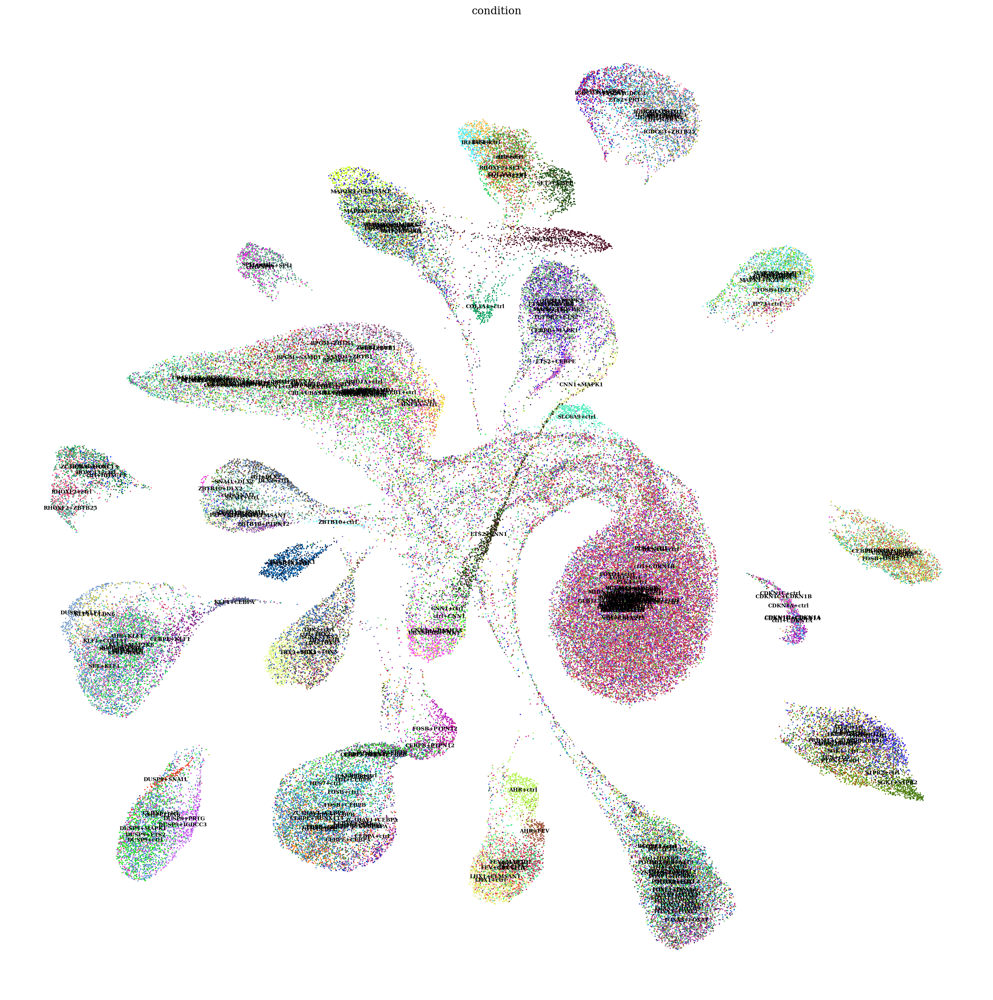

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

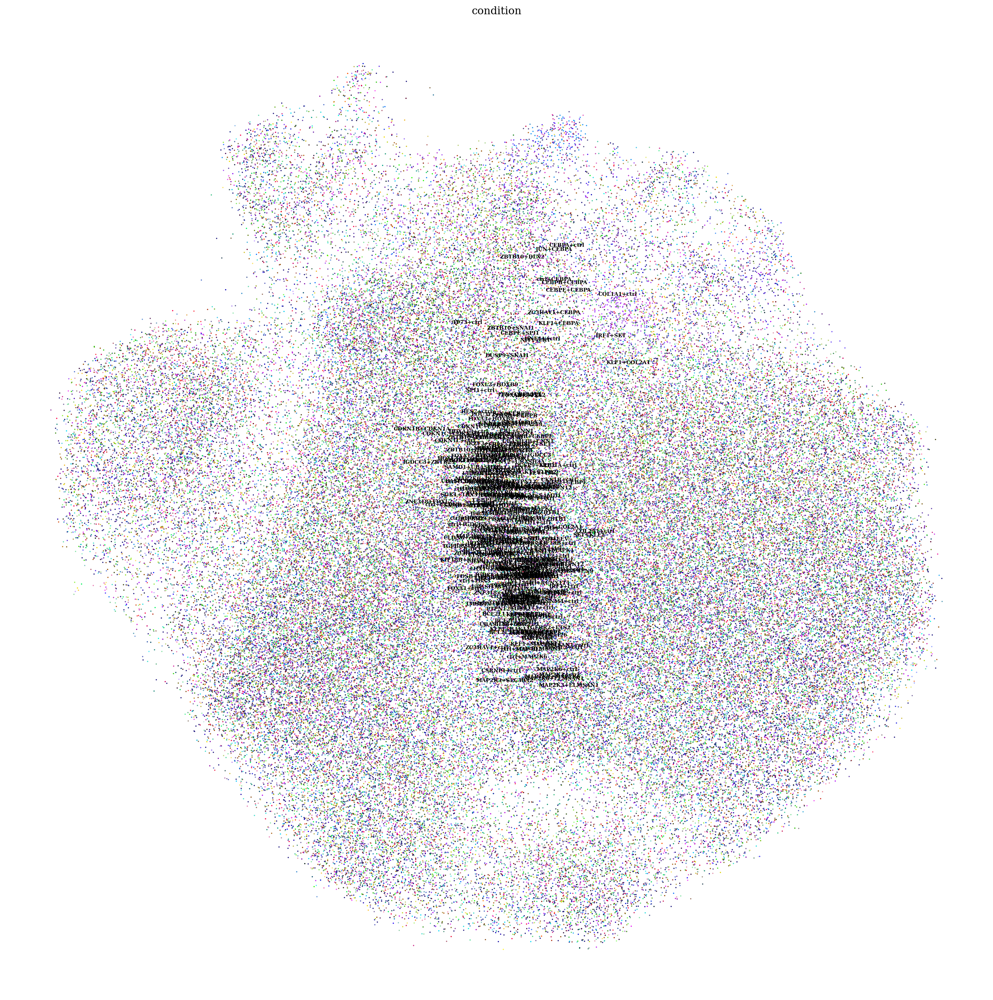

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()